In [2]:
pip install tensorflow


Defaulting to user installation because normal site-packages is not writeable
   ---------------------------------------- 0.0/385.2 MB ? eta -:--:--
   ---------------------------------------- 3.4/385.2 MB 16.8 MB/s eta 0:00:23
    --------------------------------------- 5.5/385.2 MB 14.0 MB/s eta 0:00:28
    --------------------------------------- 7.1/385.2 MB 11.2 MB/s eta 0:00:34
    --------------------------------------- 8.7/385.2 MB 10.3 MB/s eta 0:00:37
   - -------------------------------------- 9.7/385.2 MB 9.4 MB/s eta 0:00:40
   - -------------------------------------- 10.7/385.2 MB 8.4 MB/s eta 0:00:45
   - -------------------------------------- 11.3/385.2 MB 7.9 MB/s eta 0:00:48
   - -------------------------------------- 12.3/385.2 MB 7.4 MB/s eta 0:00:51
   - -------------------------------------- 13.9/385.2 MB 7.4 MB/s eta 0:00:51
   - -------------------------------------- 14.9/385.2 MB 7.1 MB/s eta 0:00:53
   - -------------------------------------- 16.0/385.2 MB 6.8 

In [1]:
pip install seaborn

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


### Summary of Tasks and Exercises Completed for Final Deliverables

#### Ex 1.1: Load the real dataset images and preparing the data for training and Visualizing Sample Images from the Training Dataset with Labels
#### Ex 2.1: Create and Train a Custom Neural Network from Scratch
#### Ex 2.2: Build, Train, and Evaluate ANN and CNN Models Using PyTorch
#### Ex 3.1: Building and Evaluating ANN and CNN Models with TensorFlow
#### Ex 4.1: Transfer Learning approach with ResNet50: Training the Model [resnet50+additional layers] from Scratch. 
#### Ex 4.2: Transfer Learning with ResNet50: Model Training, Evaluation, and Results Using TensorFlow
#### Ex 4.3: Comparing Optimizers: Evaluating Test Accuracy for Various Optimization Algorithms. 
#### Ex 5.1: Transfer Learning with VGG16: Training, Evaluating, and Saving the Model
#### Ex 6.1: Training and Testing Multiple Pretrained Models for this Image Classification problem
#### Ex 7.1: Using Active learning and verifying its effect on models performance.

----

### Exercise 1.1: Load the real dataset images and preparing the data for training and Visualizing Sample Images from the Training Dataset with Labels

#### Unrefined data

Found 8022 images belonging to 2 classes.
Found 1746 images belonging to 2 classes.
Found 2024 images belonging to 2 classes.


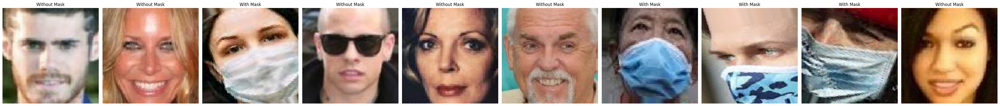

In [5]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator

IMG_HEIGHT = 128
IMG_WIDTH = 128
BATCH_SIZE = 32

datagen = ImageDataGenerator(rescale=1./255)
train_generator = datagen.flow_from_directory(
    'Unrefined\\Train',
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='binary'
)

validation_generator = datagen.flow_from_directory(
    'Unrefined\\Validation',
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='binary'
)

test_generator = datagen.flow_from_directory(
    'Unrefined\\Test',
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='binary'
)

def plot_images(images_arr, labels):
    fig, axes = plt.subplots(1, len(images_arr), figsize=(40,40))
    axes = axes.flatten()
    for img, ax, label in zip(images_arr, axes, labels):
        ax.imshow(img)
        ax.axis('off')
        ax.set_title('Without Mask' if label == 1 else 'With Mask')
    plt.tight_layout()
    plt.show()

images, labels = next(train_generator)
plot_images(images[:10], labels[:10])


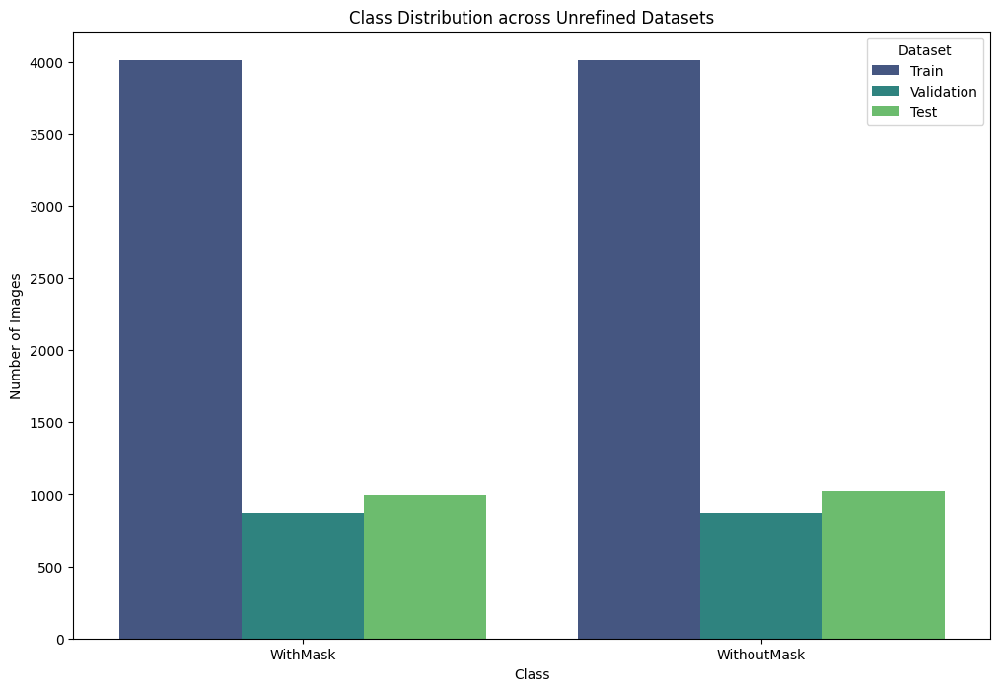

In [6]:
import seaborn as sns
import pandas as pd

def plot_combined_class_distribution(train_generator, validation_generator, test_generator):
    def get_class_distribution(generator, name):
        labels = generator.classes
        class_names = list(generator.class_indices.keys())
        label_counts = np.bincount(labels)
        return pd.DataFrame({
            'Class': class_names,
            'Count': label_counts,
            'Dataset': name
        })

    train_dist = get_class_distribution(train_generator, 'Train')
    validation_dist = get_class_distribution(validation_generator, 'Validation')
    test_dist = get_class_distribution(test_generator, 'Test')

    combined_dist = pd.concat([train_dist, validation_dist, test_dist])

    plt.figure(figsize=(12, 8))
    sns.barplot(x='Class', y='Count', hue='Dataset', data=combined_dist, palette='viridis')
    plt.title('Class Distribution across Unrefined Datasets')
    plt.ylabel('Number of Images')
    plt.xlabel('Class')
    plt.legend(title='Dataset')
    plt.show()

plot_combined_class_distribution(train_generator, validation_generator, test_generator)


#### Refined data

Found 2999 images belonging to 2 classes.
Found 640 images belonging to 2 classes.
Found 640 images belonging to 2 classes.


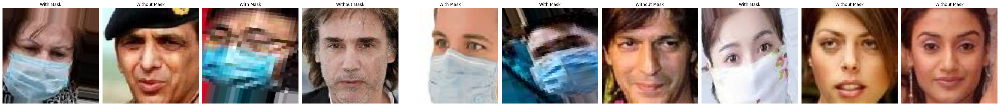

In [1]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator

IMG_HEIGHT = 128
IMG_WIDTH = 128
BATCH_SIZE = 32

datagen = ImageDataGenerator(rescale=1./255)
train_generator = datagen.flow_from_directory(
    'Train',
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='binary'
)

validation_generator = datagen.flow_from_directory(
    'Validation',
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='binary'
)

test_generator = datagen.flow_from_directory(
    'Test',
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='binary'
)

def plot_images(images_arr, labels):
    fig, axes = plt.subplots(1, len(images_arr), figsize=(40,40))
    axes = axes.flatten()
    for img, ax, label in zip(images_arr, axes, labels):
        ax.imshow(img)
        ax.axis('off')
        ax.set_title('Without Mask' if label == 1 else 'With Mask')
    plt.tight_layout()
    plt.show()

images, labels = next(train_generator)
plot_images(images[:10], labels[:10])


### Ex 1.2: Visualizing Class Distribution Across Training, Validation, and Test Datasets


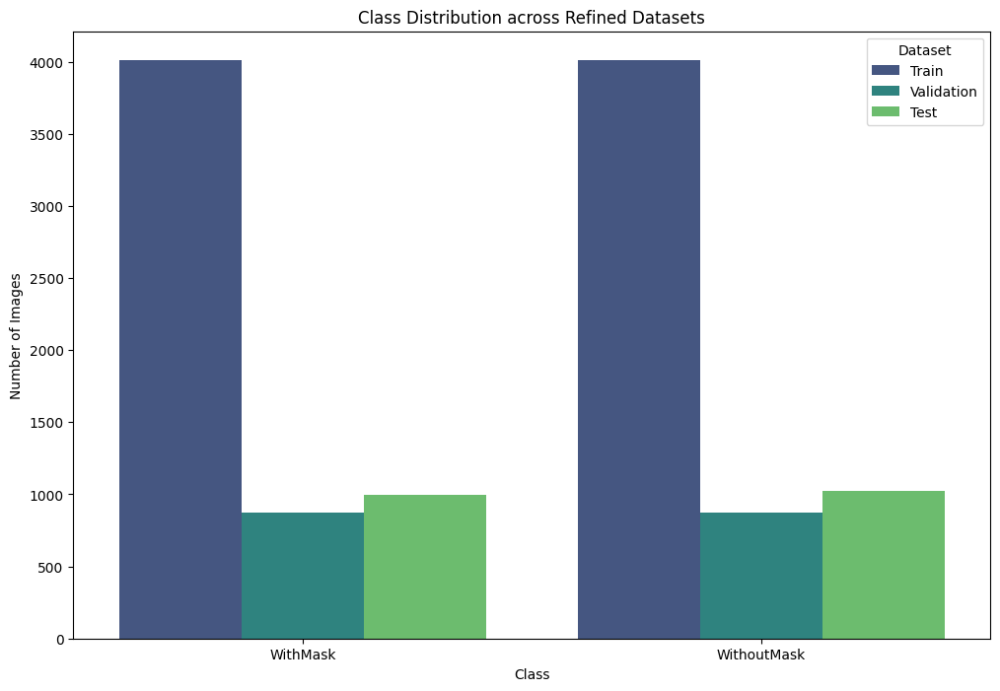

In [4]:
import seaborn as sns
import pandas as pd

def plot_combined_class_distribution(train_generator, validation_generator, test_generator):
    def get_class_distribution(generator, name):
        labels = generator.classes
        class_names = list(generator.class_indices.keys())
        label_counts = np.bincount(labels)
        return pd.DataFrame({
            'Class': class_names,
            'Count': label_counts,
            'Dataset': name
        })

    train_dist = get_class_distribution(train_generator, 'Train')
    validation_dist = get_class_distribution(validation_generator, 'Validation')
    test_dist = get_class_distribution(test_generator, 'Test')

    combined_dist = pd.concat([train_dist, validation_dist, test_dist])

    plt.figure(figsize=(12, 8))
    sns.barplot(x='Class', y='Count', hue='Dataset', data=combined_dist, palette='viridis')
    plt.title('Class Distribution across Refined Datasets')
    plt.ylabel('Number of Images')
    plt.xlabel('Class')
    plt.legend(title='Dataset')
    plt.show()

plot_combined_class_distribution(train_generator, validation_generator, test_generator)


----

### Ex 2.1: Create and Train a Custom Neural Network from Scratch

#### In this task, I built and trained a neural network from scratch without using any built-in tools. The process involved preparing the data, designing the model, training it, and evaluating its performance.


In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_dir = 'Train'
val_dir = 'Validation'
test_dir = 'Test'

train_gen = ImageDataGenerator(rescale=1.0/255.0)
val_gen = ImageDataGenerator(rescale=1.0/255.0)
test_gen = ImageDataGenerator(rescale=1.0/255.0)

train_data = train_gen.flow_from_directory(
    train_dir,
    target_size=(32, 32),
    batch_size=32,
    class_mode='binary',
    shuffle=False
)

val_data = val_gen.flow_from_directory(
    val_dir,
    target_size=(32, 32),
    batch_size=32,
    class_mode='binary',
    shuffle=False
)

test_data = test_gen.flow_from_directory(
    test_dir,
    target_size=(32, 32),
    batch_size=32,
    class_mode='binary',
    shuffle=False
)

def get_data(generator):
    imgs = []
    lbls = []
    for batch in generator:
        img_batch, lbl_batch = batch
        imgs.append(img_batch)
        lbls.append(lbl_batch)
        if len(imgs) * generator.batch_size >= generator.samples:
            break
    return np.concatenate(imgs), np.concatenate(lbls)

train_imgs, train_lbls = get_data(train_data)
val_imgs, val_lbls = get_data(val_data)
test_imgs, test_lbls = get_data(test_data)

train_imgs_flat = train_imgs.reshape(train_imgs.shape[0], -1)
val_imgs_flat = val_imgs.reshape(val_imgs.shape[0], -1)
test_imgs_flat = test_imgs.reshape(test_imgs.shape[0], -1)

input_size = 32 * 32 * 3
hidden1_size = 128
hidden2_size = 64
output_size = 1

np.random.seed(42)
w1 = np.random.randn(input_size, hidden1_size) * np.sqrt(2. / input_size)
b1 = np.zeros((1, hidden1_size))
w2 = np.random.randn(hidden1_size, hidden2_size) * np.sqrt(2. / hidden1_size)
b2 = np.zeros((1, hidden2_size))
w3 = np.random.randn(hidden2_size, output_size) * np.sqrt(2. / hidden2_size)
b3 = np.zeros((1, output_size))

def relu(x):
    return np.maximum(0, x)

def relu_derivative(x):
    return np.where(x > 0, 1, 0)

def sigmoid(x):
    return 1 / (1 + np.exp(-x))

def sigmoid_derivative(x):
    s = sigmoid(x)
    return s * (1 - s)

def binary_cross_entropy(y_true, y_pred):
    epsilon = 1e-15
    y_pred = np.clip(y_pred, epsilon, 1 - epsilon)
    loss = - np.mean(y_true * np.log(y_pred) + (1 - y_true) * np.log(1 - y_pred))
    return loss

def binary_cross_entropy_derivative(y_true, y_pred):
    epsilon = 1e-15
    y_pred = np.clip(y_pred, epsilon, 1 - epsilon)
    grad = y_pred - y_true.reshape(-1, 1)
    return grad / y_true.shape[0]

def forward_pass(X):
    z1 = np.dot(X, w1) + b1
    a1 = relu(z1)
    z2 = np.dot(a1, w2) + b2
    a2 = relu(z2)
    z3 = np.dot(a2, w3) + b3
    a3 = sigmoid(z3)
    return z1, a1, z2, a2, z3, a3

def backward_pass(X, y, z1, a1, z2, a2, z3, a3, lr=0.01):
    global w1, b1, w2, b2, w3, b3

    dz3 = binary_cross_entropy_derivative(y, a3)
    dw3 = np.dot(a2.T, dz3)
    db3 = np.sum(dz3, axis=0, keepdims=True)

    dz2 = np.dot(dz3, w3.T) * relu_derivative(z2)
    dw2 = np.dot(a1.T, dz2)
    db2 = np.sum(dz2, axis=0, keepdims=True)

    dz1 = np.dot(dz2, w2.T) * relu_derivative(z1)
    dw1 = np.dot(X.T, dz1)
    db1 = np.sum(dz1, axis=0, keepdims=True)

    w1 -= lr * dw1
    b1 -= lr * db1
    w2 -= lr * dw2
    b2 -= lr * db2
    w3 -= lr * dw3
    b3 -= lr * db3

epochs = 30
learning_rate = 0.01
train_acc_list = []
val_acc_list = []
val_split = 0.1
num_val_samples = int(val_split * train_imgs_flat.shape[0])
val_imgs_split = train_imgs_flat[:num_val_samples]
val_lbls_split = train_lbls[:num_val_samples]
train_imgs_split = train_imgs_flat[num_val_samples:]
train_lbls_split = train_lbls[num_val_samples:]

for epoch in range(epochs):

    z1, a1, z2, a2, z3, a3 = forward_pass(train_imgs_split)
    loss = binary_cross_entropy(train_lbls_split, a3)
    backward_pass(train_imgs_split, train_lbls_split, z1, a1, z2, a2, z3, a3, learning_rate)
    train_preds = (a3 > 0.5).astype(int).flatten()
    train_acc = np.mean(train_preds == train_lbls_split)
    train_acc_list.append(train_acc)

    z1_val, a1_val, z2_val, a2_val, z3_val, a3_val = forward_pass(val_imgs_split)
    val_preds = (a3_val > 0.5).astype(int).flatten()
    val_acc = np.mean(val_preds == val_lbls_split)
    val_acc_list.append(val_acc)

    print(f'Epoch {epoch+1}/{epochs}, Train Accuracy: {train_acc:.4f}, Val Accuracy: {val_acc:.4f}')

_, _, _, _, _, a3_test = forward_pass(test_imgs_flat)
test_preds = (a3_test > 0.5).astype(int).flatten()
test_acc = np.mean(test_preds == test_lbls)
print(f'Test accuracy of custom built model: {test_acc:.4f}')


Found 8191 images belonging to 2 classes.

Found 1817 images belonging to 2 classes.

Found 1784 images belonging to 2 classes.

Epoch 1/30, Train Accuracy: 0.5619, Val Accuracy: 0.2979

Epoch 2/30, Train Accuracy: 0.5883, Val Accuracy: 0.2344

Epoch 3/30, Train Accuracy: 0.6135, Val Accuracy: 0.3150

Epoch 4/30, Train Accuracy: 0.6466, Val Accuracy: 0.3211

Epoch 5/30, Train Accuracy: 0.6645, Val Accuracy: 0.3736

Epoch 6/30, Train Accuracy: 0.6894, Val Accuracy: 0.4017

Epoch 7/30, Train Accuracy: 0.7075, Val Accuracy: 0.4396

Epoch 8/30, Train Accuracy: 0.7294, Val Accuracy: 0.4701

Epoch 9/30, Train Accuracy: 0.7432, Val Accuracy: 0.4982

Epoch 10/30, Train Accuracy: 0.7615, Val Accuracy: 0.5263

Epoch 11/30, Train Accuracy: 0.7729, Val Accuracy: 0.5482

Epoch 12/30, Train Accuracy: 0.7855, Val Accuracy: 0.5702

Epoch 13/30, Train Accuracy: 0.7976, Val Accuracy: 0.5897

Epoch 14/30, Train Accuracy: 0.8078, Val Accuracy: 0.6032

Epoch 15/30, Train Accuracy: 0.8151, Val Accuracy: 0.6

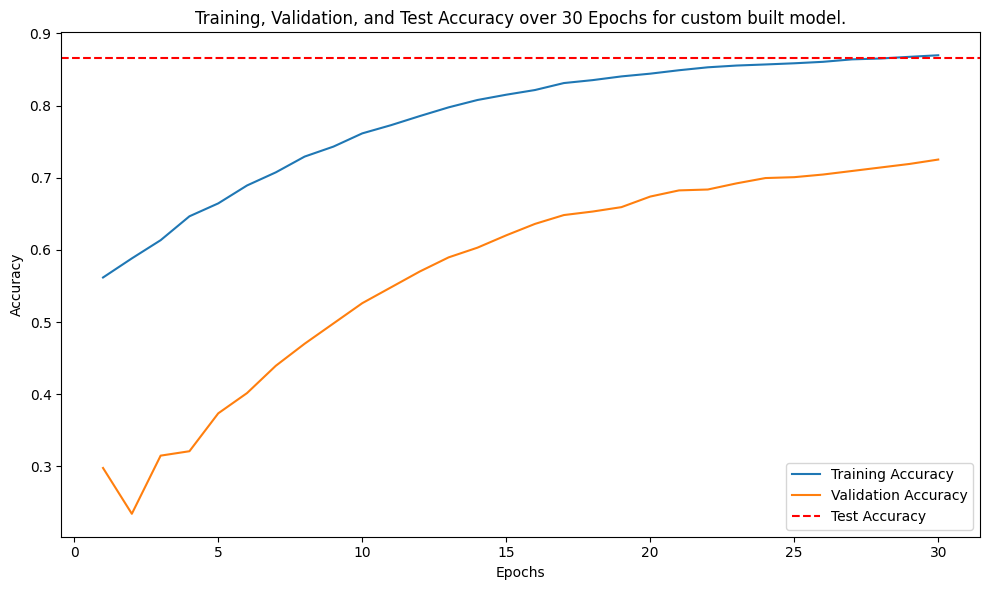

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(range(1, epochs + 1), train_accuracy_list, label='Training Accuracy')
plt.plot(range(1, epochs + 1), val_accuracy_list, label='Validation Accuracy')
plt.axhline(y=test_accuracy, color='r', linestyle='--', label='Test Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training, Validation, and Test Accuracy over 30 Epochs for custom built model.')
plt.legend()
plt.tight_layout()
plt.show()

----

### Ex 2.2: Build, Train, and Evaluate ANN and CNN Models Using PyTorch

#### In this experiment, I built, trained, and evaluated two types of neural networks—an artificial neural network (ANN) and a convolutional neural network (CNN)—using PyTorch. This was done out of curiosity to explore and experiment with PyTorch for the first time.


In [6]:
import torch
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
from torchvision import datasets, transforms
import numpy as np
import torch.nn as nn

class MyDataset(Dataset):
    def __init__(self, directory, transform=None):
        self.data = datasets.ImageFolder(directory, transform=transform)
    
    def __len__(self):
        return len(self.data)
    
    def __getitem__(self, index):
        img, label = self.data[index]
        img = np.array(img).astype(np.float32).transpose((2, 0, 1)) / 255.0
        return torch.tensor(img), torch.tensor(label, dtype=torch.long)

transform = transforms.Compose([
    transforms.Resize((128, 128)),
])

train_data = MyDataset('Train', transform=transform)
val_data = MyDataset('Validation', transform=transform)
test_data = MyDataset('Test', transform=transform)

train_loader = DataLoader(train_data, batch_size=32, shuffle=True)
val_loader = DataLoader(val_data, batch_size=32, shuffle=False)
test_loader = DataLoader(test_data, batch_size=32, shuffle=False)

class SimpleANN(nn.Module):
    def __init__(self):
        super(SimpleANN, self).__init__()
        self.fc1 = nn.Linear(128*128*3, 256)
        self.fc2 = nn.Linear(256, 128)
        self.fc3 = nn.Linear(128, 64)
        self.fc4 = nn.Linear(64, 32)
        self.fc5 = nn.Linear(32, 1)

    def forward(self, x):
        x = x.view(x.size(0), -1)
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = F.relu(self.fc3(x))
        x = F.relu(self.fc4(x))
        x = torch.sigmoid(self.fc5(x))
        return x

class SimpleCNN(nn.Module):
    def __init__(self):
        super(SimpleCNN, self).__init__()
        self.conv1 = nn.Conv2d(3, 64, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(128, 256, kernel_size=3, padding=1)
        self.conv4 = nn.Conv2d(256, 512, kernel_size=3, padding=1)
        self.fc1 = nn.Linear(512 * 8 * 8, 256)
        self.fc2 = nn.Linear(256, 128)
        self.fc3 = nn.Linear(128, 64)
        self.fc4 = nn.Linear(64, 32)
        self.fc5 = nn.Linear(32, 1)

    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = F.max_pool2d(x, 2)
        x = F.relu(self.conv2(x))
        x = F.max_pool2d(x, 2)
        x = F.relu(self.conv3(x))
        x = F.max_pool2d(x, 2)
        x = F.relu(self.conv4(x))
        x = F.max_pool2d(x, 2)
        x = x.view(x.size(0), -1)
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = F.relu(self.fc3(x))
        x = F.relu(self.fc4(x))
        x = torch.sigmoid(self.fc5(x))
        return x

def train(model, loader, epochs=10, learning_rate=0.001):
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
    criterion = torch.nn.BCELoss()
    
    for epoch in range(epochs):
        model.train()
        total_loss = 0.0
        correct = 0
        total = 0
        for images, labels in loader:
            optimizer.zero_grad()
            outputs = model(images)
            labels = labels.float().unsqueeze(1)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            total_loss += loss.item()
            preds = outputs > 0.5
            correct += (preds.float() == labels).sum().item()
            total += labels.size(0)
        
        accuracy = correct / total
        print(f'Epoch [{epoch+1}/{epochs}], Loss: {total_loss/len(loader)}, Accuracy: {accuracy}')

def evaluate(model, loader):
    model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in loader:
            outputs = model(images)
            preds = outputs > 0.5
            correct += (preds.float() == labels.unsqueeze(1).float()).sum().item()
            total += labels.size(0)
    accuracy = correct / total
    print(f'Test Accuracy: {accuracy}')

ann_model = SimpleANN()
cnn_model = SimpleCNN()

print("Training ANN Model:")
train(ann_model, train_loader)

print("Training CNN Model:")
train(cnn_model, train_loader)

print("Evaluating ANN Model:")
evaluate(ann_model, test_loader)

print("Evaluating CNN Model:")
evaluate(cnn_model, test_loader)


Training ANN Model:
Epoch [1/10], Loss: 0.4177964595705271, Accuracy: 0.80375
Epoch [2/10], Loss: 0.2478776265308261, Accuracy: 0.90125
Epoch [3/10], Loss: 0.21687977977097034, Accuracy: 0.9146875
Epoch [4/10], Loss: 0.1985765428096056, Accuracy: 0.92375
Epoch [5/10], Loss: 0.15627139957621694, Accuracy: 0.94375
Epoch [6/10], Loss: 0.1575373009033501, Accuracy: 0.94125
Epoch [7/10], Loss: 0.160260842256248, Accuracy: 0.934375
Epoch [8/10], Loss: 0.12530433816835285, Accuracy: 0.9525
Epoch [9/10], Loss: 0.1347218832047656, Accuracy: 0.9515625
Epoch [10/10], Loss: 0.1100270338030532, Accuracy: 0.9553125
Training CNN Model:
Epoch [1/10], Loss: 0.3670965425297618, Accuracy: 0.80125
Epoch [2/10], Loss: 0.14400036776438355, Accuracy: 0.9478125
Epoch [3/10], Loss: 0.09360392600065097, Accuracy: 0.970625
Epoch [4/10], Loss: 0.08267202332615853, Accuracy: 0.971875
Epoch [5/10], Loss: 0.05977901781719993, Accuracy: 0.979375
Epoch [6/10], Loss: 0.05942668042029254, Accuracy: 0.980625
Epoch [7/10]

#### Now I used above trained PyTorch model to load and preprocess new images, make predictions, and visualize the results. The goal was to test the model's performance on unseen data and categorize images as "With Mask" or "Without Mask."


Image: NewTest\178.png, Prediction: 0.0000, Label: With Mask
Image: NewTest\187.png, Prediction: 0.9918, Label: Without Mask
Image: NewTest\190.png, Prediction: 0.0000, Label: With Mask
Image: NewTest\219.png, Prediction: 0.9631, Label: Without Mask
Image: NewTest\231.png, Prediction: 0.9995, Label: Without Mask
Image: NewTest\283.png, Prediction: 1.0000, Label: Without Mask
Image: NewTest\350.png, Prediction: 0.0000, Label: With Mask
Image: NewTest\351.png, Prediction: 0.0000, Label: With Mask
Image: NewTest\69.png, Prediction: 1.0000, Label: Without Mask
Image: NewTest\72.png, Prediction: 1.0000, Label: Without Mask
Image: NewTest\download (1).jpg, Prediction: 0.0576, Label: With Mask
Image: NewTest\download (2).jpg, Prediction: 0.0000, Label: With Mask
Image: NewTest\download (3).jpg, Prediction: 0.0000, Label: With Mask
Image: NewTest\download (4).jpg, Prediction: 0.0002, Label: With Mask
Image: NewTest\download (6).jpg, Prediction: 0.0000, Label: With Mask
Image: NewTest\download 

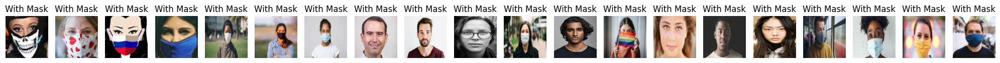

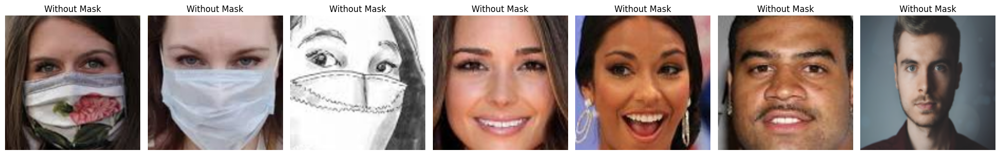

In [8]:
import os
import numpy as np
import torch
from PIL import Image
import matplotlib.pyplot as plt
from torchvision import transforms

def preprocess_image(img_path):
    img = Image.open(img_path).convert('RGB')
    transform = transforms.Compose([
        transforms.Resize((128, 128)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    img_tensor = transform(img)
    img_tensor = img_tensor.unsqueeze(0)
    return img_tensor

image_dir = 'NewTest'

image_files = [os.path.join(image_dir, f) for f in os.listdir(image_dir)]

mask_images = []
no_mask_images = []

model = cnn_model  
model.eval()

for img_path in image_files:
    try:
        img_tensor = preprocess_image(img_path)
        with torch.no_grad():
            prediction = model(img_tensor).item()
        label = 'Without Mask' if prediction > 0.5 else 'With Mask'
        print(f"Image: {img_path}, Prediction: {prediction:.4f}, Label: {label}")
        
        img = Image.open(img_path).resize((128, 128))
        if label == 'Without Mask':
            no_mask_images.append(np.array(img))
        else:
            mask_images.append(np.array(img))
    except Exception as e:
        print(f"Error with image {img_path}: {e}")

def display_images(img_arr, labels):
    fig, ax = plt.subplots(1, len(img_arr), figsize=(20, 20))
    ax = ax.flatten()
    for img, a, label in zip(img_arr, ax, labels):
        a.imshow(img)
        a.axis('off')
        a.set_title(label)
    plt.tight_layout()
    plt.show()

if mask_images:
    display_images(mask_images, ['With Mask'] * len(mask_images))

if no_mask_images:
    display_images(no_mask_images, ['Without Mask'] * len(no_mask_images))


----

### Ex 3.1: Building and Evaluating ANN and CNN Models with TensorFlow

#### In this exercise, I constructed two types of neural network models using TensorFlow: a moderately dense Artificial Neural Network (ANN) and a Convolutional Neural Network (CNN). 

In [5]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPooling2D, Dropout
import math

IMG_HEIGHT = 128
IMG_WIDTH = 128
BATCH_SIZE = 32

datagen = ImageDataGenerator(rescale=1./255)
train_generator = datagen.flow_from_directory(
    'Train',
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='binary'
)
validation_generator = datagen.flow_from_directory(
    'Validation',
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='binary'
)
test_generator = datagen.flow_from_directory(
    'Test',
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='binary'
)


ann_model = Sequential([
    Flatten(input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)),
    Dense(256, activation='relu'),
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dense(32, activation='relu'),
    Dense(1, activation='sigmoid')
])

ann_model.compile(optimizer='adam',
                  loss='binary_crossentropy',
                  metrics=['accuracy'])

cnn_model = Sequential([
    Conv2D(64, (3, 3), activation='relu', input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(256, (3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(512, (3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Flatten(),
    Dense(256, activation='relu'),
    Dropout(0.5),
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dense(32, activation='relu'),
    Dense(1, activation='sigmoid')
])

cnn_model.compile(optimizer='adam',
                  loss='binary_crossentropy',
                  metrics=['accuracy'])

ann_history = ann_model.fit(
    train_generator,
    epochs=10,
    validation_data=validation_generator,
)

cnn_history = cnn_model.fit(
    train_generator,
    epochs=10,
    validation_data=validation_generator,
)

ann_loss, ann_accuracy = ann_model.evaluate(test_generator)
print(f'ANN Model - Loss: {ann_loss}, Accuracy: {ann_accuracy}')

cnn_loss, cnn_accuracy = cnn_model.evaluate(test_generator)
print(f'CNN Model - Loss: {cnn_loss}, Accuracy: {cnn_accuracy}')


Found 3200 images belonging to 2 classes.
Found 640 images belonging to 2 classes.
Found 640 images belonging to 2 classes.


C:\Users\mmac259\AppData\Roaming\Python\Python310\site-packages\keras\src\layers\reshaping\flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
C:\Users\mmac259\AppData\Roaming\Python\Python310\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10


C:\Users\mmac259\AppData\Roaming\Python\Python310\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


100/100 ━━━━━━━━━━━━━━━━━━━━ 69s 640ms/step - accuracy: 0.7047 - loss: 1.3946 - val_accuracy: 0.8219 - val_loss: 0.4435
Epoch 2/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 65s 605ms/step - accuracy: 0.8778 - loss: 0.3364 - val_accuracy: 0.8641 - val_loss: 0.3715
Epoch 3/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 67s 628ms/step - accuracy: 0.8793 - loss: 0.3339 - val_accuracy: 0.8672 - val_loss: 0.3576
Epoch 4/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 69s 658ms/step - accuracy: 0.9113 - loss: 0.2351 - val_accuracy: 0.8734 - val_loss: 0.3998
Epoch 5/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 68s 656ms/step - accuracy: 0.9114 - loss: 0.2441 - val_accuracy: 0.8797 - val_loss: 0.3348
Epoch 6/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 69s 656ms/step - accuracy: 0.9334 - loss: 0.1692 - val_accuracy: 0.8844 - val_loss: 0.3357
Epoch 7/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 68s 642ms/step - accuracy: 0.9352 - loss: 0.1672 - val_accuracy: 0.8844 - val_loss: 0.3419
Epoch 8/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 70s 657ms/step - accuracy: 0.9355 - loss: 0.1756 - val

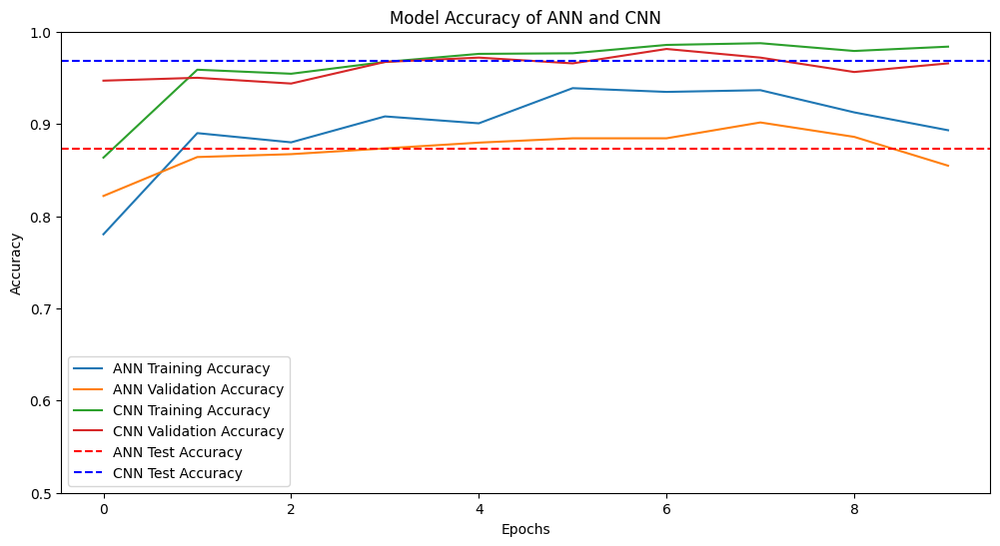

In [6]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 6))
plt.plot(ann_history.history['accuracy'], label='ANN Training Accuracy')
plt.plot(ann_history.history['val_accuracy'], label='ANN Validation Accuracy')
plt.plot(cnn_history.history['accuracy'], label='CNN Training Accuracy')
plt.plot(cnn_history.history['val_accuracy'], label='CNN Validation Accuracy')
plt.ylim([0.5,1.0])
plt.axhline(y=ann_accuracy, color='r', linestyle='--', label='ANN Test Accuracy')
plt.axhline(y=cnn_accuracy, color='b', linestyle='--', label='CNN Test Accuracy')

plt.title('Model Accuracy of ANN and CNN')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()


Found 640 images belonging to 2 classes.


C:\Users\mmac259\AppData\Roaming\Python\Python310\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


20/20 - 10s - 482ms/step - accuracy: 0.9688 - loss: 0.1272
CNN Model - Loss: 0.12716737389564514, Accuracy: 0.96875
20/20 - 4s - 196ms/step
Y_pred: [[4.9713572e-07]
 [1.1781770e-09]
 [1.1037769e-07]
 [1.0646973e-03]
 [1.7775730e-03]
 [5.2717024e-07]
 [2.3479188e-02]
 [5.1347720e-16]
 [7.0326034e-09]
 [1.6866721e-01]]
Y_pred_classes: [0 0 0 0 0 0 0 0 0 0]
Y_true: [0 0 0 0 0 0 0 0 0 0]


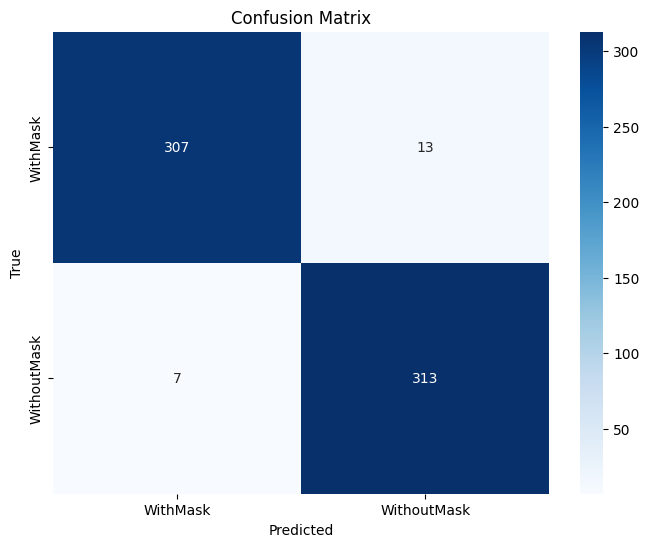

              precision    recall  f1-score   support

    WithMask       0.98      0.96      0.97       320
 WithoutMask       0.96      0.98      0.97       320

    accuracy                           0.97       640
   macro avg       0.97      0.97      0.97       640
weighted avg       0.97      0.97      0.97       640



In [14]:
test_gen = datagen.flow_from_directory(
    'Test',
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='binary',
    shuffle=False
)

from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt

cnn_loss, cnn_acc = cnn_model.evaluate(test_gen, verbose=2)
print(f'CNN Model - Loss: {cnn_loss}, Accuracy: {cnn_acc}')

test_gen.reset()

y_pred = cnn_model.predict(test_gen, verbose=2)
y_pred_classes = (y_pred > 0.5).astype(int).flatten()
y_true = test_gen.classes

print(f'y_pred: {y_pred[:10]}')
print(f'y_pred_classes: {y_pred_classes[:10]}')
print(f'y_true: {y_true[:10]}')

cm = confusion_matrix(y_true, y_pred_classes)
cm_labels = list(test_gen.class_indices.keys())

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', xticklabels=cm_labels, yticklabels=cm_labels, cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

print(classification_report(y_true, y_pred_classes, target_names=cm_labels))


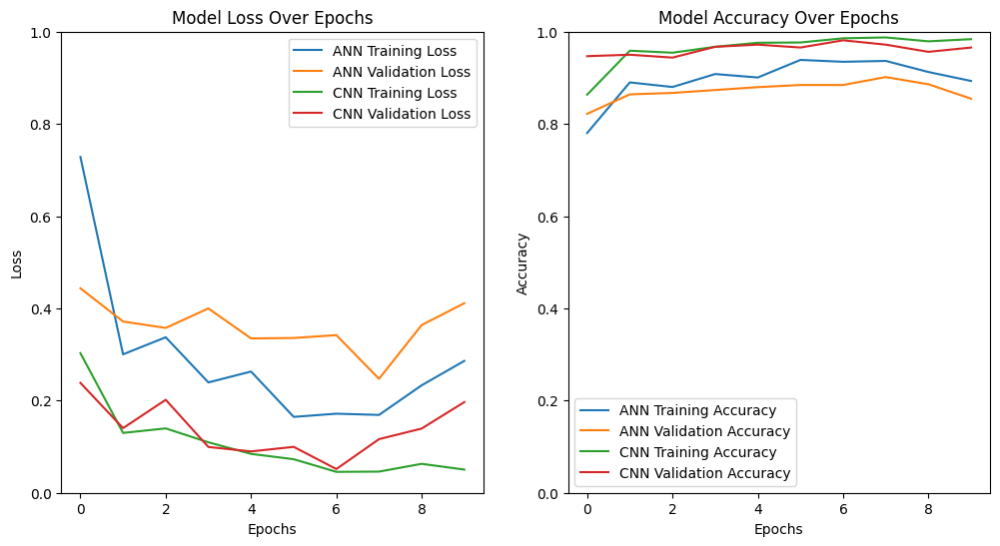

In [12]:
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(ann_history.history['loss'], label='ANN Training Loss')
plt.plot(ann_history.history['val_loss'], label='ANN Validation Loss')
plt.plot(cnn_history.history['loss'], label='CNN Training Loss')
plt.plot(cnn_history.history['val_loss'], label='CNN Validation Loss')
plt.title('Model Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.ylim([0,1.0])
plt.subplot(1, 2, 2)
plt.plot(ann_history.history['accuracy'], label='ANN Training Accuracy')
plt.plot(ann_history.history['val_accuracy'], label='ANN Validation Accuracy')
plt.plot(cnn_history.history['accuracy'], label='CNN Training Accuracy')
plt.plot(cnn_history.history['val_accuracy'], label='CNN Validation Accuracy')
plt.title('Model Accuracy Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.ylim([0,1.0])
plt.show()

### Predicting New Images with the Trained CNN Model

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


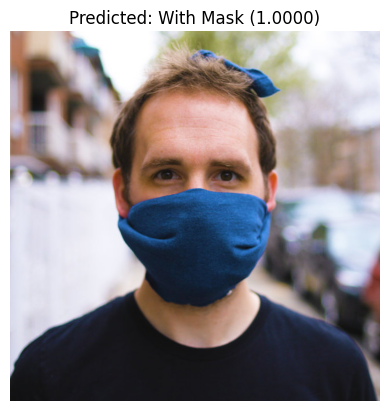

In [17]:

def preprocess_image(img_path):
    img = tf.keras.utils.load_img(img_path, target_size=(IMG_HEIGHT, IMG_WIDTH))
    img_array = tf.keras.utils.img_to_array(img)
    img_array = tf.expand_dims(img_array, axis=0)
    img_array /= 255.0 
    return img_array

def predict_and_display_image(img_path, cnn_model, threshold=0.5):
    img_array = preprocess_image(img_path)
    prediction = cnn_model.predict(img_array)
    plt.imshow(tf.keras.utils.load_img(img_path))
    plt.axis('off')
    if prediction[0] > threshold:
        plt.title(f'Predicted: Without Mask ({prediction[0][0]:.4f})')
    else:
        plt.title(f'Predicted: With Mask ({1 - prediction[0][0]:.4f})')
    plt.show()

new_image_path = 'NewTest\with.jpg'
predict_and_display_image(new_image_path, cnn_model, threshold=0.6)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


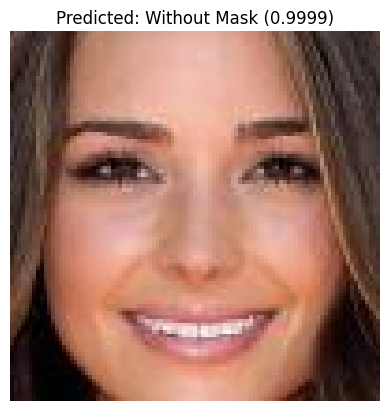

In [ ]:
new_image_path = 'NewTest\283.png'
predict_and_display_image(new_image_path, cnn_model, threshold=0.6)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


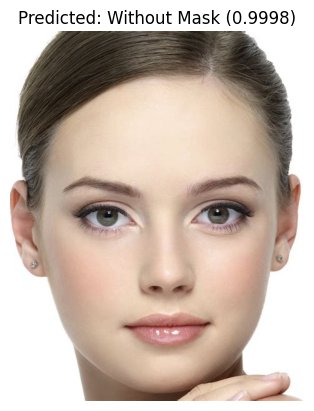

In [ ]:
new_image_path = 'NewTest/th.jpg'
predict_and_display_image(new_image_path, cnn_model, threshold=0.6)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


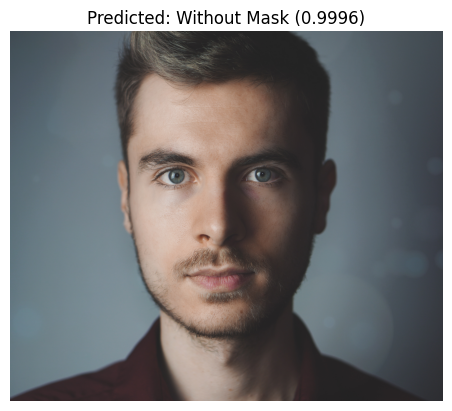

In [20]:
new_image_path = 'NewTest/face-13.jpg'
predict_and_display_image(new_image_path, cnn_model, threshold=0.6)

----

#### Ex 4.1: Transfer Learning approach with ResNet50: Training the Model [resnet50+additional layers] from Scratch. 

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from math import ceil

IMG_HEIGHT = 128
IMG_WIDTH = 128
BATCH_SIZE = 128
EPOCHS = 10
LEARNING_RATE = 0.001

datagen = ImageDataGenerator(rescale=1./255)

train_gen = datagen.flow_from_directory(
    'Train',
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='binary'
)

val_gen = datagen.flow_from_directory(
    'Validation',
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='binary'
)

test_gen = datagen.flow_from_directory(
    'Test',
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='binary'
)

train_samples = len(train_gen.filenames)
val_samples = len(val_gen.filenames)
steps_per_epoch = ceil(train_samples / BATCH_SIZE)
validation_steps = ceil(val_samples / BATCH_SIZE)

base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(IMG_HEIGHT, IMG_WIDTH, 3))
base_model.trainable = False

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(128, activation='relu')(x)
x = Dense(128, activation='relu')(x)
x = Dense(64, activation='relu')(x)
pred = Dense(1, activation='sigmoid')(x)

model = Model(inputs=base_model.input, outputs=pred)

optimizer = tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE)
loss_fn = tf.keras.losses.BinaryCrossentropy()

def train_step(images, labels):
    with tf.GradientTape() as tape:
        preds = model(images, training=True)
        loss = loss_fn(labels, preds)
    
    gradients = tape.gradient(loss, model.trainable_variables)
    optimizer.apply_gradients(zip(gradients, model.trainable_variables))
    
    accuracy = tf.keras.metrics.binary_accuracy(labels, preds)
    return loss, accuracy

def train_model(train_gen, val_gen, epochs):
    history = {'loss': [], 'accuracy': [], 'val_loss': [], 'val_accuracy': []}
    
    for epoch in range(epochs):
        print(f'Epoch {epoch + 1}/{epochs}')
        
        epoch_loss = 0
        epoch_accuracy = 0
        num_samples = 0
        
        for step in range(steps_per_epoch):
            batch_images, batch_labels = next(train_gen)
            batch_loss, batch_accuracy = train_step(batch_images, batch_labels)
            batch_size = batch_images.shape[0]
            epoch_loss += batch_loss.numpy() * batch_size
            epoch_accuracy += tf.reduce_sum(batch_accuracy).numpy()
            num_samples += batch_size
            print(f'Step {step + 1} of Epoch {epoch + 1} completed')
        
        epoch_loss /= num_samples
        epoch_accuracy /= num_samples
        history['loss'].append(epoch_loss)
        history['accuracy'].append(epoch_accuracy)
        
        val_loss, val_accuracy = 0, 0
        num_samples = 0
        
        for step in range(validation_steps):
            batch_images, batch_labels = next(val_gen)
            preds = model(batch_images, training=False)
            loss = loss_fn(batch_labels, preds)
            batch_size = batch_images.shape[0]
            val_loss += loss.numpy() * batch_size
            val_accuracy += tf.reduce_sum(tf.keras.metrics.binary_accuracy(batch_labels, preds)).numpy()
            num_samples += batch_size
            print(f'Step {step + 1} of Validation in Epoch {epoch + 1} completed')
        
        val_loss /= num_samples
        val_accuracy /= num_samples
        history['val_loss'].append(val_loss)
        history['val_accuracy'].append(val_accuracy)
        
        print(f'Loss: {epoch_loss:.4f}, Accuracy: {epoch_accuracy:.4f}, Val Loss: {val_loss:.4f}, Val Accuracy: {val_accuracy:.4f}')
    
    return history

history = train_model(train_gen, val_gen, EPOCHS)

def evaluate_model(test_gen):
    test_loss, test_accuracy = 0, 0
    num_samples = 0
    
    for step in range(steps_per_epoch):
        batch_images, batch_labels = next(test_gen)
        preds = model(batch_images, training=False)
        loss = loss_fn(batch_labels, preds)
        batch_size = batch_images.shape[0]
        test_loss += loss.numpy() * batch_size
        test_accuracy += tf.reduce_sum(tf.keras.metrics.binary_accuracy(batch_labels, preds)).numpy()
        num_samples += batch_size
        print(f'Step {step + 1} of Testing completed')
    
    test_loss /= num_samples
    test_accuracy /= num_samples
    return test_loss, test_accuracy

test_loss, test_accuracy = evaluate_model(test_gen)
print(f'Test accuracy: {test_accuracy:.4f}')


Found 3200 images belonging to 2 classes.
Found 640 images belonging to 2 classes.
Found 640 images belonging to 2 classes.
Epoch 1/10
Step 1 of Epoch 1 completed
Step 2 of Epoch 1 completed
Step 3 of Epoch 1 completed
Step 4 of Epoch 1 completed
Step 5 of Epoch 1 completed
Step 6 of Epoch 1 completed
Step 7 of Epoch 1 completed
Step 8 of Epoch 1 completed
Step 9 of Epoch 1 completed
Step 10 of Epoch 1 completed
Step 11 of Epoch 1 completed
Step 12 of Epoch 1 completed
Step 13 of Epoch 1 completed
Step 14 of Epoch 1 completed
Step 15 of Epoch 1 completed
Step 16 of Epoch 1 completed
Step 17 of Epoch 1 completed
Step 18 of Epoch 1 completed
Step 19 of Epoch 1 completed
Step 20 of Epoch 1 completed
Step 21 of Epoch 1 completed
Step 22 of Epoch 1 completed
Step 23 of Epoch 1 completed
Step 24 of Epoch 1 completed
Step 25 of Epoch 1 completed
Step 1 of Validation in Epoch 1 completed
Step 2 of Validation in Epoch 1 completed
Step 3 of Validation in Epoch 1 completed
Step 4 of Validation in

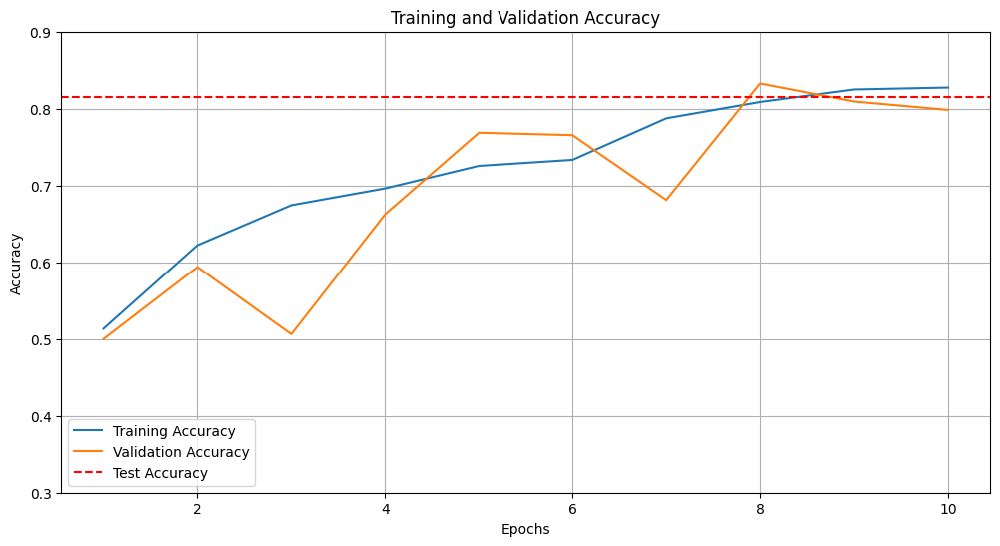

In [ ]:
epochs_range = range(1, EPOCHS + 1)
plt.figure(figsize=(12, 6))

plt.plot(epochs_range, history['accuracy'], label='Training Accuracy')
plt.plot(epochs_range, history['val_accuracy'], label='Validation Accuracy')
plt.axhline(y=test_accuracy, color='r', linestyle='--', label='Test Accuracy')
plt.ylim([0.3,0.9])
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.grid(True)
plt.show()

#### Predicting New Images with the above Trained Model

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
Image: NewTest\178.png, Prediction: 0.0003, Label: With Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
Image: NewTest\187.png, Prediction: 0.1475, Label: With Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
Image: NewTest\190.png, Prediction: 0.0275, Label: With Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
Image: NewTest\219.png, Prediction: 0.7338, Label: Without Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
Image: NewTest\231.png, Prediction: 0.0447, Label: With Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
Image: NewTest\283.png, Prediction: 0.8905, Label: Without Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Image: NewTest\350.png, Prediction: 0.0165, Label: With Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Image: NewTest\351.png, Prediction: 0.0368, Label: With Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
Image: NewTest\64.png, Prediction: 0.7557, Label: Without Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Image: NewTest\65.png, Prediction: 0.7777, Label: Without Mask
1/

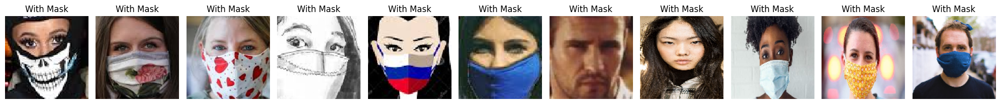

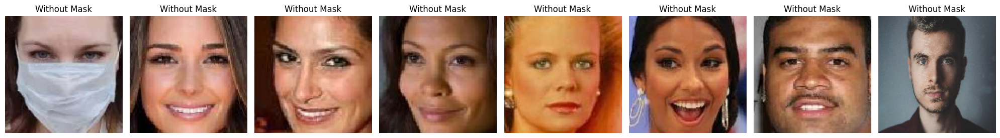

In [ ]:
import os
import numpy as np
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import matplotlib.pyplot as plt

def preprocess_image(img_path):
    img = load_img(img_path, target_size=(IMG_HEIGHT, IMG_WIDTH))
    img_arr = img_to_array(img)
    img_arr = np.expand_dims(img_arr, axis=0)
    img_arr /= 255.0
    return img_arr

img_folder = 'NewTest'
img_paths = [os.path.join(img_folder, fname) for fname in os.listdir(img_folder)]

with_mask_imgs = []
without_mask_imgs = []

for path in img_paths:
    try:
        img_arr = preprocess_image(path)
        pred = model.predict(img_arr)[0][0]
        label = 'Without Mask' if pred > 0.5 else 'With Mask'
        print(f"Image: {path}, Prediction: {pred:.4f}, Label: {label}")
        if label == 'Without Mask':
            without_mask_imgs.append(img_arr[0])
        else:
            with_mask_imgs.append(img_arr[0])
    except Exception as e:
        print(f"Error with image {path}: {e}")

def display_images(img_list, labels):
    fig, axes = plt.subplots(1, len(img_list), figsize=(20, 20))
    axes = axes.flatten()
    for img, ax, label in zip(img_list, axes, labels):
        ax.imshow(img)
        ax.axis('off')
        ax.set_title(label)
    plt.tight_layout()
    plt.show()

if with_mask_imgs:
    display_images(with_mask_imgs, ['With Mask'] * len(with_mask_imgs))

if without_mask_imgs:
    display_images(without_mask_imgs, ['Without Mask'] * len(without_mask_imgs))


----

### Ex 4.2: Transfer Learning with ResNet50: Model Training, Evaluation, and Results Using TensorFlow

In [16]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
import json
import os

IMG_HEIGHT = 128
IMG_WIDTH = 128
BATCH_SIZE = 64
EPOCHS = 10

train_dir = 'Train'
validation_dir = 'Validation'
test_dir = 'Test'

datagen = ImageDataGenerator(rescale=1./255)

train_gen = datagen.flow_from_directory(
    train_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='binary'
)

val_gen = datagen.flow_from_directory(
    validation_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='binary'
)

test_gen = datagen.flow_from_directory(
    test_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='binary',
    shuffle=False
)

base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(IMG_HEIGHT, IMG_WIDTH, 3))
base_model.trainable = False

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dense(128, activation='relu')(x)
x = Dense(64, activation='relu')(x)
preds = Dense(1, activation='sigmoid')(x)

model = Model(inputs=base_model.input, outputs=preds)
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

history = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=EPOCHS
)

test_loss, test_accuracy = model.evaluate(test_gen, verbose=2)
print(f'Test accuracy of model using transfer learning with ResNet50: {test_accuracy:.4f}')

model_name = 'resnet50_model'
model_path = f'{model_name}.h5'
model.save(model_path)
print(f'Model saved as {model_path}')

history_dict = history.history
history_filename = f'{model_name}_history.json'
with open(history_filename, 'w') as f:
    json.dump(history_dict, f)
print(f'Training history saved as {history_filename}')

results = {
    'test_loss': test_loss,
    'test_accuracy': test_accuracy
}
results_filename = f'{model_name}_results.json'
with open(results_filename, 'w') as f:
    json.dump(results, f)
print(f'Test results saved as {results_filename}')


Found 3200 images belonging to 2 classes.
Found 640 images belonging to 2 classes.
Found 640 images belonging to 2 classes.
Epoch 1/10


C:\Users\mmac259\AppData\Roaming\Python\Python310\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


50/50 ━━━━━━━━━━━━━━━━━━━━ 90s 1s/step - accuracy: 0.5213 - loss: 0.6926 - val_accuracy: 0.5750 - val_loss: 0.6638
Epoch 2/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 77s 1s/step - accuracy: 0.6393 - loss: 0.6386 - val_accuracy: 0.7469 - val_loss: 0.5980
Epoch 3/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 81s 2s/step - accuracy: 0.7220 - loss: 0.5645 - val_accuracy: 0.5734 - val_loss: 0.7248
Epoch 4/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 80s 1s/step - accuracy: 0.6835 - loss: 0.5753 - val_accuracy: 0.8141 - val_loss: 0.4768
Epoch 5/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 77s 1s/step - accuracy: 0.7950 - loss: 0.4619 - val_accuracy: 0.7906 - val_loss: 0.4861
Epoch 6/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 79s 1s/step - accuracy: 0.8297 - loss: 0.4032 - val_accuracy: 0.8484 - val_loss: 0.3833
Epoch 7/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 75s 1s/step - accuracy: 0.8087 - loss: 0.4301 - val_accuracy: 0.8609 - val_loss: 0.3797
Epoch 8/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 134s 2s/step - accuracy: 0.8644 - loss: 0.3339 - val_accuracy: 0.8359 - val_loss: 0.3751
Ep

Test accuracy of model using transfer learning with ResNet50: 0.8594
Model saved as resnet50_model.h5
Training history saved as resnet50_model_history.json
Test results saved as resnet50_model_results.json


20/20 - 13s - 632ms/step - accuracy: 0.8594 - loss: 0.3649
resnet50_model - Loss: 0.3648945093154907, Accuracy: 0.8594
20/20 - 10s - 504ms/step
              precision    recall  f1-score   support

    WithMask       0.80      0.96      0.87       320
 WithoutMask       0.95      0.76      0.84       320

    accuracy                           0.86       640
   macro avg       0.87      0.86      0.86       640
weighted avg       0.87      0.86      0.86       640



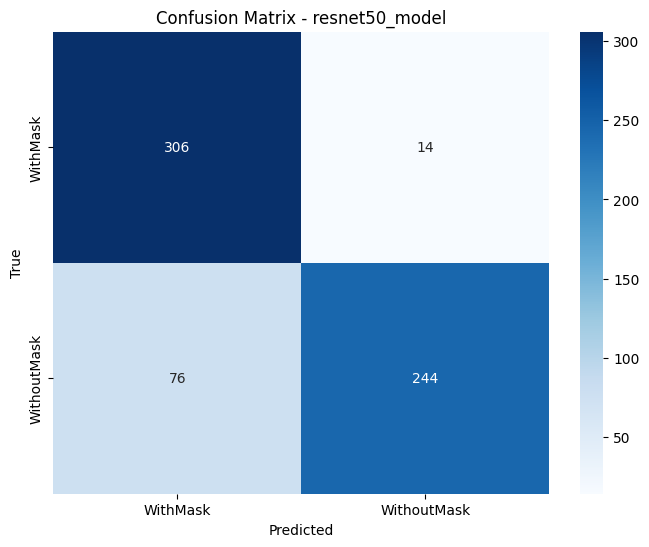

In [28]:
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

def evaluate_and_plot_confusion_matrix(model_name):
    model = tf.keras.models.load_model(f'{model_name}.h5')
    test_loss, test_accuracy = model.evaluate(test_generator, verbose=2)
    print(f'{model_name} - Loss: {test_loss}, Accuracy: {test_accuracy:.4f}')

    predictions = model.predict(test_generator, verbose=2)
    predicted_classes = (predictions > 0.5).astype(int).flatten()
    true_classes = test_generator.classes

    class_names = list(test_generator.class_indices.keys())
    print(classification_report(true_classes, predicted_classes, target_names=class_names))

    conf_matrix = confusion_matrix(true_classes, predicted_classes)
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt='d', xticklabels=class_names, yticklabels=class_names, cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f'Confusion Matrix - {model_name}')
    plt.show()

evaluate_and_plot_confusion_matrix('resnet50_model')


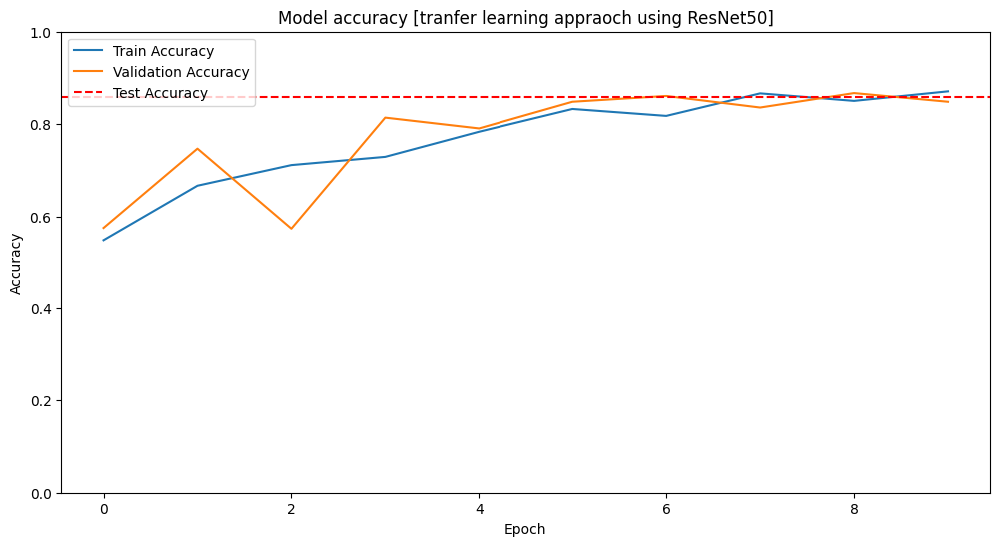

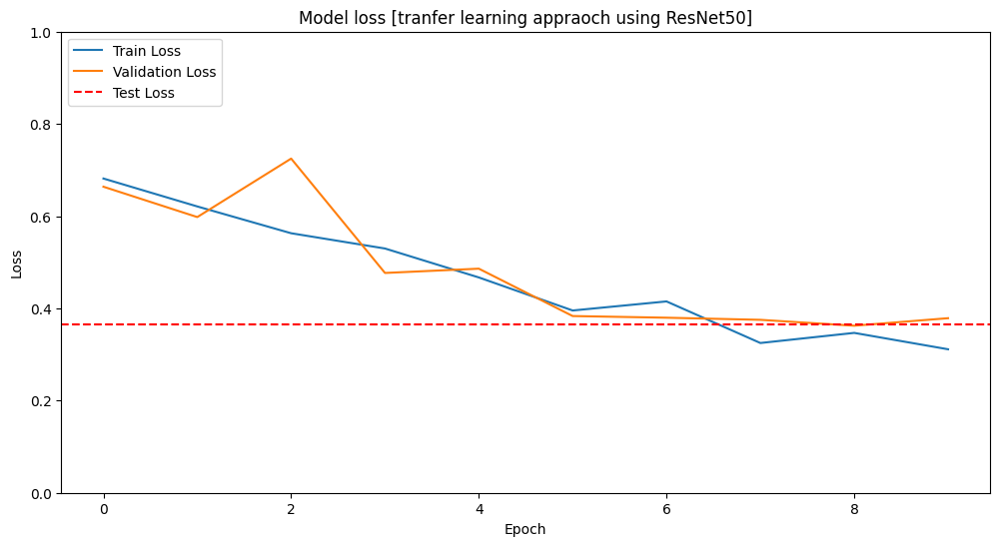

In [20]:
plt.figure(figsize=(12, 6))
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.axhline(y=test_accuracy, color='r', linestyle='--', label='Test Accuracy')
plt.title('Model accuracy [tranfer learning appraoch using ResNet50]')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0,1])
plt.legend(loc='upper left')
plt.savefig(f'{model_name}_accuracy_plot.png')
plt.show()

plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.axhline(y=test_loss, color='r', linestyle='--', label='Test Loss')
plt.title('Model loss [tranfer learning appraoch using ResNet50]')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.ylim([0,1])
plt.legend(loc='upper left')
plt.savefig(f'{model_name}_loss_plot.png')
plt.show()


### Predicting New Data with a Pretrained ResNet50 Model and Visualizing Results

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
Image: NewTest\178.png, Prediction: 0.0001, Label: With Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Image: NewTest\187.png, Prediction: 0.1077, Label: With Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
Image: NewTest\190.png, Prediction: 0.0109, Label: With Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Image: NewTest\219.png, Prediction: 0.8486, Label: Without Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Image: NewTest\231.png, Prediction: 0.0508, Label: With Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
Image: NewTest\283.png, Prediction: 0.9734, Label: Without Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
Image: NewTest\350.png, Prediction: 0.0130, Label: With Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Image: NewTest\351.png, Prediction: 0.0289, Label: With Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
Image: NewTest\64.png, Prediction: 0.9281, Label: Without Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
Image: NewTest\65.png, Prediction: 0.9119, Label: Without Mask
1/

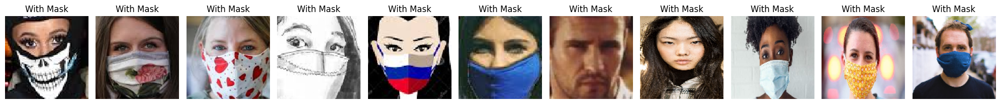

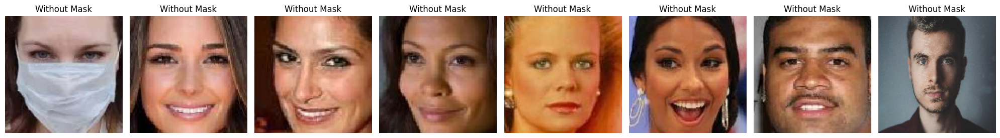

In [19]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array

IMG_HEIGHT = 128
IMG_WIDTH = 128
images_folder = 'NewTest'

model_name = 'resnet50_model.h5'
model = tf.keras.models.load_model(model_name)

def load_and_preprocess_image(image_path):
    img = load_img(image_path, target_size=(IMG_HEIGHT, IMG_WIDTH))
    img_array = img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = img_array / 255.0  
    return img_array

image_paths = [os.path.join(images_folder, img_name) for img_name in os.listdir(images_folder)]
with_mask_images = []
without_mask_images = []

for image_path in image_paths:
    try:
        img_array = load_and_preprocess_image(image_path)
        prediction = model.predict(img_array)
        label = 'Without Mask' if prediction > 0.5 else 'With Mask'
        print(f"Image: {image_path}, Prediction: {prediction[0][0]:.4f}, Label: {label}")
        if label == 'Without Mask':
            without_mask_images.append(img_array[0])
        else:
            with_mask_images.append(img_array[0])
    except Exception as e:
        print(f"Error loading image {image_path}: {e}")

def plot_images(images_arr, labels):
    fig, axes = plt.subplots(1, len(images_arr), figsize=(20, 20))
    axes = axes.flatten()
    for img, ax, label in zip(images_arr, axes, labels):
        ax.imshow(img)
        ax.axis('off')
        ax.set_title(label)
    plt.tight_layout()
    plt.show()

if with_mask_images:
    plot_images(with_mask_images, ['With Mask'] * len(with_mask_images))

if without_mask_images:
    plot_images(without_mask_images, ['Without Mask'] * len(without_mask_images))


----

### Ex 4.3: Comparing Optimizers: Evaluating Test Accuracy for Various Optimization Algorithms. 

Found 3200 images belonging to 2 classes.
Found 640 images belonging to 2 classes.
Found 640 images belonging to 2 classes.


C:\Users\mmac259\AppData\Roaming\Python\Python310\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Test accuracy with Adam: 0.8875
Test accuracy with RMSprop: 0.8578
Test accuracy with Adagrad: 0.5609
Test accuracy with Momentum: 0.5203


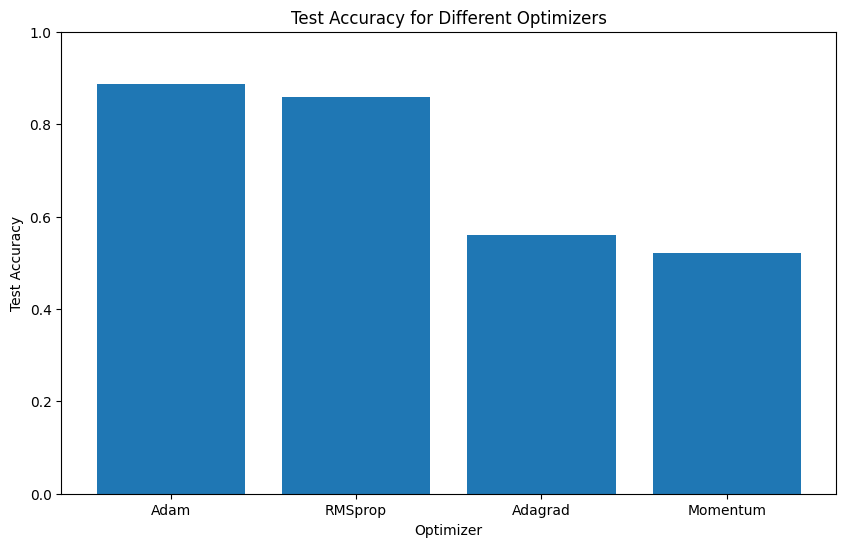

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model

img_height = 128
img_width = 128
batch_size = 32

datagen = ImageDataGenerator(rescale=1./255)

train_gen = datagen.flow_from_directory(
    'Train',
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary'
)

val_gen = datagen.flow_from_directory(
    'Validation',
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary'
)

test_gen = datagen.flow_from_directory(
    'Test',
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary'
)

optimizers = {
    'Adam': tf.keras.optimizers.Adam(),
    'RMSprop': tf.keras.optimizers.RMSprop(),
    'Adagrad': tf.keras.optimizers.Adagrad(),
    'Momentum': tf.keras.optimizers.SGD(momentum=0.9)
}

results = {}

for name, opt in optimizers.items():
    base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(img_height, img_width, 3))
    base_model.trainable = False
    
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(128, activation='relu')(x)
    x = Dense(128, activation='relu')(x)
    x = Dense(64, activation='relu')(x)
    pred = Dense(1, activation='sigmoid')(x)
    
    model = Model(inputs=base_model.input, outputs=pred)
    
    model.compile(optimizer=opt, loss='binary_crossentropy', metrics=['accuracy'])
    
    history = model.fit(
        train_gen,
        validation_data=val_gen,
        epochs=10,
        verbose=0
    )
    
    test_loss, test_acc = model.evaluate(test_gen, verbose=0)
    results[name] = test_acc
    print(f'Test accuracy with {name}: {test_acc:.4f}')

plt.figure(figsize=(10, 6))
plt.bar(results.keys(), results.values())
plt.title('Test Accuracy for Different Optimizers')
plt.xlabel('Optimizer')
plt.ylabel('Test Accuracy')
plt.ylim([0.0, 1.0])
plt.show()


----

### Ex 5.1: Transfer Learning with VGG16: Training, Evaluating, and Saving the Model

In [10]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import json
import os
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns

img_height = 128
img_width = 128
batch_size = 32
epochs = 10

datagen = ImageDataGenerator(rescale=1./255)

train_gen = datagen.flow_from_directory(
    'Train',
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary'
)

val_gen = datagen.flow_from_directory(
    'Validation',
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary'
)

test_gen = datagen.flow_from_directory(
    'Test',
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary',
    shuffle=False
)

base_model = VGG16(weights='imagenet', include_top=False, input_shape=(img_height, img_width, 3))
base_model.trainable = False

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dense(128, activation='relu')(x)
x = Dense(64, activation='relu')(x)
pred = Dense(1, activation='sigmoid')(x)

model = Model(inputs=base_model.input, outputs=pred)
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

history = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=epochs
)

model_name = 'vgg16_model'
model_path = f'{model_name}.h5'
model.save(model_path)
print(f'Model saved as {model_path}')

history_dict = history.history
history_filename = f'{model_name}_history.json'
with open(history_filename, 'w') as f:
    json.dump(history_dict, f)
print(f'Training history saved as {history_filename}')

test_loss, test_acc = model.evaluate(test_gen, verbose=2)
print(f'{model_name} - Loss: {test_loss}, Accuracy: {test_acc:.4f}')

results = {
    'test_loss': test_loss,
    'test_accuracy': test_acc
}
results_filename = f'{model_name}_results.json'
with open(results_filename, 'w') as f:
    json.dump(results, f)
print(f'Test results saved as {results_filename}')


Found 3200 images belonging to 2 classes.
Found 640 images belonging to 2 classes.
Found 640 images belonging to 2 classes.
Epoch 1/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 108s 1s/step - accuracy: 0.9050 - loss: 0.2521 - val_accuracy: 0.9703 - val_loss: 0.0891
Epoch 2/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 109s 1s/step - accuracy: 0.9848 - loss: 0.0493 - val_accuracy: 0.9719 - val_loss: 0.0791
Epoch 3/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 109s 1s/step - accuracy: 0.9863 - loss: 0.0326 - val_accuracy: 0.9656 - val_loss: 0.0881
Epoch 4/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 112s 1s/step - accuracy: 0.9898 - loss: 0.0299 - val_accuracy: 0.9812 - val_loss: 0.0570
Epoch 5/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 109s 1s/step - accuracy: 0.9887 - loss: 0.0262 - val_accuracy: 0.9781 - val_loss: 0.0726
Epoch 6/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 110s 1s/step - accuracy: 0.9945 - loss: 0.0182 - val_accuracy: 0.9781 - val_loss: 0.0623
Epoch 7/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 109s 1s/step - accuracy: 0.9974 - loss: 0.0093 - val_accuracy:

Model saved as vgg16_model.h5
Training history saved as vgg16_model_history.json
20/20 - 18s - 900ms/step - accuracy: 0.9797 - loss: 0.0811
vgg16_model - Loss: 0.0810772180557251, Accuracy: 0.9797
Test results saved as vgg16_model_results.json


20/20 - 18s - 915ms/step - accuracy: 0.9797 - loss: 0.0811
vgg16_model - Loss: 0.0810772180557251, Accuracy: 0.9797
20/20 - 18s - 880ms/step
              precision    recall  f1-score   support

    WithMask       0.97      0.99      0.98       320
 WithoutMask       0.99      0.97      0.98       320

    accuracy                           0.98       640
   macro avg       0.98      0.98      0.98       640
weighted avg       0.98      0.98      0.98       640



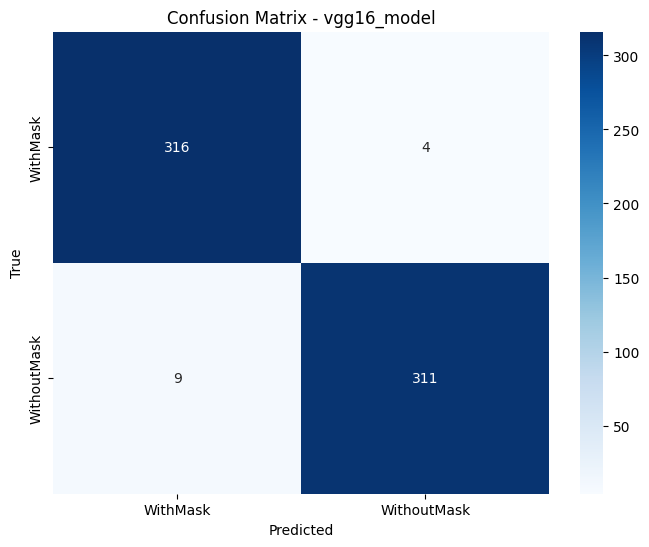

In [11]:
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

def eval_and_plot_cm(model_name):
    model = tf.keras.models.load_model(f'{model_name}.h5')
    test_loss, test_acc = model.evaluate(test_gen, verbose=2)
    print(f'{model_name} - Loss: {test_loss}, Accuracy: {test_acc:.4f}')

    preds = model.predict(test_gen, verbose=2)
    pred_classes = (preds > 0.5).astype(int).flatten()
    true_classes = test_gen.classes

    class_names = list(test_gen.class_indices.keys())
    print(classification_report(true_classes, pred_classes, target_names=class_names))

    cm = confusion_matrix(true_classes, pred_classes)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', xticklabels=class_names, yticklabels=class_names, cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f'Confusion Matrix - {model_name}')
    plt.show()

model_name = 'vgg16_model'
eval_and_plot_cm(model_name)


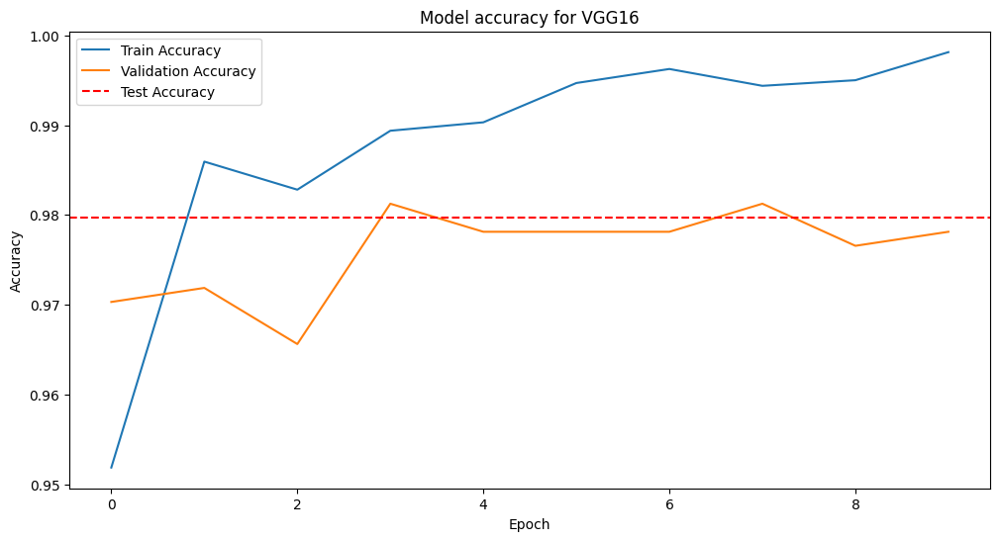

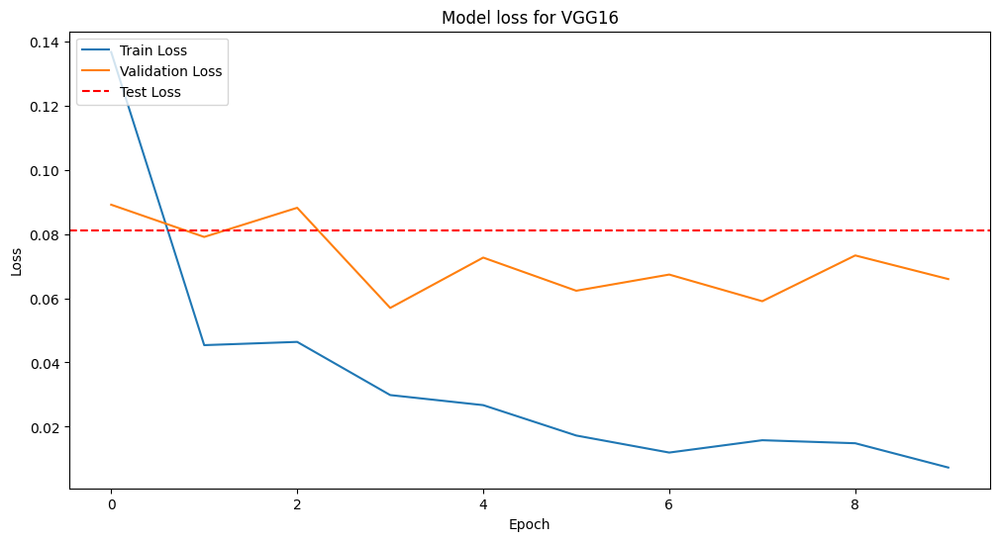

In [14]:
plt.figure(figsize=(12, 6))
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.axhline(y=test_acc, color='r', linestyle='--', label='Test Accuracy')
plt.title('Model accuracy for VGG16')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='upper left')
plt.savefig(f'{model_name}_accuracy_plot.png')
plt.show()

plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.axhline(y=test_loss, color='r', linestyle='--', label='Test Loss')
plt.title('Model loss for VGG16')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper left')
plt.savefig(f'{model_name}_loss_plot.png')
plt.show()


### Predicting new data. 

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
Image: NewTest\178.png, Prediction: [[2.015764e-08]], Label: With Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
Image: NewTest\187.png, Prediction: [[7.155299e-08]], Label: With Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
Image: NewTest\190.png, Prediction: [[2.6951785e-12]], Label: With Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
Image: NewTest\219.png, Prediction: [[6.520963e-13]], Label: With Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
Image: NewTest\231.png, Prediction: [[0.00660834]], Label: With Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
Image: NewTest\283.png, Prediction: [[1.]], Label: Without Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
Image: NewTest\350.png, Prediction: [[1.2132389e-17]], Label: With Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
Image: NewTest\351.png, Prediction: [[4.4086096e-10]], Label: With Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
Image: NewTest\64.png, Prediction: [[1.]], Label: Without Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/st

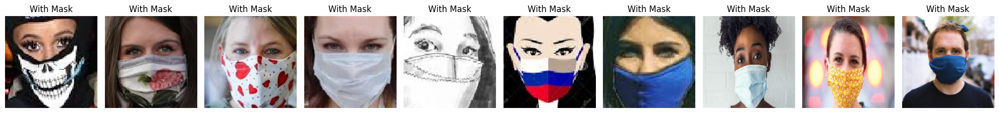

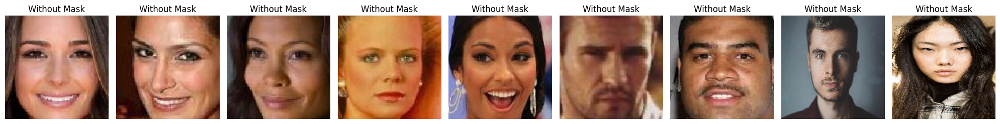

In [18]:
import os
from tensorflow.keras.preprocessing.image import load_img, img_to_array

images_folder = 'NewTest'

def load_and_preprocess_image(image_path):
    img = load_img(image_path, target_size=(IMG_HEIGHT, IMG_WIDTH))
    img_array = img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = img_array / 255.0  
    return img_array

image_paths = [os.path.join(images_folder, img_name) for img_name in os.listdir(images_folder)]
with_mask_images = []
without_mask_images = []

for image_path in image_paths:
    try:
        img_array = load_and_preprocess_image(image_path)
        prediction = model.predict(img_array)
        label = 'Without Mask' if prediction > 0.5 else 'With Mask'
        print(f"Image: {image_path}, Prediction: {prediction}, Label: {label}")
        if label == 'Without Mask':
            without_mask_images.append(img_array[0])
        else:
            with_mask_images.append(img_array[0])
    except Exception as e:
        print(f"Error loading image {image_path}: {e}")

def plot_images(images_arr, labels):
    fig, axes = plt.subplots(1, len(images_arr), figsize=(20, 20))
    axes = axes.flatten()
    for img, ax, label in zip(images_arr, axes, labels):
        ax.imshow(img)
        ax.axis('off')
        ax.set_title(label)
    plt.tight_layout()
    plt.show()

if with_mask_images:
    plot_images(with_mask_images, ['With Mask'] * len(with_mask_images))

if without_mask_images:
    plot_images(without_mask_images, ['Without Mask'] * len(without_mask_images))


----
----

### Ex 6.1: Training and Testing Multiple Pretrained Models for this Image Classification problem
#### This script evaluates various pretrained models (VGG19, ResNet101, InceptionV3, DenseNet121, MobileNetV2) using transfer learning. Each model is trained for 5 epochs, and performance metrics such as accuracy, confusion matrix, and classification report are computed to determine which model performs best for the given image classification task.








In [44]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import json
import os
import seaborn as sns
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG19, ResNet101, InceptionV3, DenseNet121, MobileNetV2
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from sklearn.metrics import confusion_matrix, classification_report

IMG_HEIGHT = 128
IMG_WIDTH = 128
BATCH_SIZE = 32
EPOCHS = 5
MODELS = {
    'vgg19': VGG19,
    'resnet101': ResNet101,
    'inceptionv3': InceptionV3,
    'densenet121': DenseNet121,
    'mobilenetv2': MobileNetV2
}
params = {
    'vgg19': {'include_top': False},
    'resnet101': {'include_top': False},
    'inceptionv3': {'include_top': False},
    'densenet121': {'include_top': False},
    'mobilenetv2': {'include_top': False}
}

datagen = ImageDataGenerator(rescale=1./255)

train_gen = datagen.flow_from_directory(
    'Train',
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='binary'
)

val_gen = datagen.flow_from_directory(
    'Validation',
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='binary'
)

test_gen = datagen.flow_from_directory(
    'Test',
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='binary',
    shuffle=False
)

def create_model(model_name):
    model_class = MODELS[model_name]
    base_params = params[model_name]
    
    base_model = model_class(weights='imagenet', input_shape=(IMG_HEIGHT, IMG_WIDTH, 3), **base_params)
    base_model.trainable = False
    
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(256, activation='relu')(x)
    x = Dense(128, activation='relu')(x)
    x = Dense(64, activation='relu')(x)
    preds = Dense(1, activation='sigmoid')(x)
    
    model = Model(inputs=base_model.input, outputs=preds)
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

def train_and_eval_model(model_name):
    model = create_model(model_name)
    
    history = model.fit(
        train_gen,
        validation_data=val_gen,
        epochs=EPOCHS
    )
    
    model_path = f'{model_name}_model.h5'
    model.save(model_path)
    print(f'{model_name} model saved as {model_path}')
    
    history_dict = history.history
    history_filename = f'{model_name}_history.json'
    with open(history_filename, 'w') as f:
        json.dump(history_dict, f)
    print(f'Training history saved as {history_filename}')
    
    test_loss, test_acc = model.evaluate(test_gen, verbose=2)
    print(f'{model_name} - Loss: {test_loss}, Accuracy: {test_acc:.4f}')
    
    results = {
        'test_loss': test_loss,
        'test_accuracy': test_acc
    }
    results_filename = f'{model_name}_results.json'
    with open(results_filename, 'w') as f:
        json.dump(results, f)
    print(f'Test results saved as {results_filename}')
    
    preds = model.predict(test_gen, verbose=2)
    pred_classes = (preds > 0.5).astype(int).flatten()
    true_classes = test_gen.classes
    
    class_names = list(test_gen.class_indices.keys())
    print(classification_report(true_classes, pred_classes, target_names=class_names))
    
    cm = confusion_matrix(true_classes, pred_classes)
    return test_acc, cm, class_names

cms = {}
accs = {}
for model_name in MODELS.keys():
    acc, cm, class_names = train_and_eval_model(model_name)
    accs[model_name] = acc
    cms[model_name] = (cm, class_names)


Found 3200 images belonging to 2 classes.
Found 640 images belonging to 2 classes.
Found 640 images belonging to 2 classes.
Epoch 1/5


C:\Users\mmac259\AppData\Roaming\Python\Python310\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


100/100 ━━━━━━━━━━━━━━━━━━━━ 148s 1s/step - accuracy: 0.8448 - loss: 0.3408 - val_accuracy: 0.9609 - val_loss: 0.0944
Epoch 2/5
100/100 ━━━━━━━━━━━━━━━━━━━━ 143s 1s/step - accuracy: 0.9687 - loss: 0.0803 - val_accuracy: 0.9750 - val_loss: 0.0672
Epoch 3/5
100/100 ━━━━━━━━━━━━━━━━━━━━ 142s 1s/step - accuracy: 0.9761 - loss: 0.0598 - val_accuracy: 0.9766 - val_loss: 0.0651
Epoch 4/5
100/100 ━━━━━━━━━━━━━━━━━━━━ 142s 1s/step - accuracy: 0.9819 - loss: 0.0529 - val_accuracy: 0.9688 - val_loss: 0.0727
Epoch 5/5
100/100 ━━━━━━━━━━━━━━━━━━━━ 150s 1s/step - accuracy: 0.9880 - loss: 0.0332 - val_accuracy: 0.9719 - val_loss: 0.0833


vgg19 model saved as vgg19_model.h5
Training history saved as vgg19_history.json
20/20 - 23s - 1s/step - accuracy: 0.9688 - loss: 0.1004
vgg19 - Loss: 0.10040515661239624, Accuracy: 0.9688
Test results saved as vgg19_results.json
20/20 - 25s - 1s/step
              precision    recall  f1-score   support

    WithMask       0.96      0.98      0.97       320
 WithoutMask       0.98      0.96      0.97       320

    accuracy                           0.97       640
   macro avg       0.97      0.97      0.97       640
weighted avg       0.97      0.97      0.97       640

Epoch 1/5
100/100 ━━━━━━━━━━━━━━━━━━━━ 108s 919ms/step - accuracy: 0.5625 - loss: 0.6800 - val_accuracy: 0.6297 - val_loss: 0.6304
Epoch 2/5
100/100 ━━━━━━━━━━━━━━━━━━━━ 89s 874ms/step - accuracy: 0.6918 - loss: 0.5821 - val_accuracy: 0.7734 - val_loss: 0.5087
Epoch 3/5
100/100 ━━━━━━━━━━━━━━━━━━━━ 93s 901ms/step - accuracy: 0.7725 - loss: 0.4771 - val_accuracy: 0.7953 - val_loss: 0.4618
Epoch 4/5
100/100 ━━━━━━━━━━━━

resnet101 model saved as resnet101_model.h5
Training history saved as resnet101_history.json
20/20 - 16s - 800ms/step - accuracy: 0.8266 - loss: 0.4058
resnet101 - Loss: 0.40579086542129517, Accuracy: 0.8266
Test results saved as resnet101_results.json
20/20 - 19s - 954ms/step
              precision    recall  f1-score   support

    WithMask       0.85      0.79      0.82       320
 WithoutMask       0.80      0.86      0.83       320

    accuracy                           0.83       640
   macro avg       0.83      0.83      0.83       640
weighted avg       0.83      0.83      0.83       640

Epoch 1/5
100/100 ━━━━━━━━━━━━━━━━━━━━ 64s 543ms/step - accuracy: 0.9289 - loss: 0.1561 - val_accuracy: 0.9797 - val_loss: 0.0713
Epoch 2/5
100/100 ━━━━━━━━━━━━━━━━━━━━ 50s 477ms/step - accuracy: 0.9902 - loss: 0.0224 - val_accuracy: 0.9875 - val_loss: 0.0801
Epoch 3/5
100/100 ━━━━━━━━━━━━━━━━━━━━ 50s 467ms/step - accuracy: 0.9933 - loss: 0.0127 - val_accuracy: 0.9797 - val_loss: 0.0685
Epoch

inceptionv3 model saved as inceptionv3_model.h5
Training history saved as inceptionv3_history.json
20/20 - 8s - 379ms/step - accuracy: 0.9953 - loss: 0.0098
inceptionv3 - Loss: 0.009802782908082008, Accuracy: 0.9953
Test results saved as inceptionv3_results.json
20/20 - 7s - 330ms/step
              precision    recall  f1-score   support

    WithMask       0.99      1.00      1.00       320
 WithoutMask       1.00      0.99      1.00       320

    accuracy                           1.00       640
   macro avg       1.00      1.00      1.00       640
weighted avg       1.00      1.00      1.00       640

Epoch 1/5
100/100 ━━━━━━━━━━━━━━━━━━━━ 78s 611ms/step - accuracy: 0.9513 - loss: 0.1023 - val_accuracy: 0.9937 - val_loss: 0.0176
Epoch 2/5
100/100 ━━━━━━━━━━━━━━━━━━━━ 58s 551ms/step - accuracy: 0.9968 - loss: 0.0140 - val_accuracy: 0.9937 - val_loss: 0.0128
Epoch 3/5
100/100 ━━━━━━━━━━━━━━━━━━━━ 58s 548ms/step - accuracy: 0.9950 - loss: 0.0073 - val_accuracy: 0.9953 - val_loss: 0.0

densenet121 model saved as densenet121_model.h5
Training history saved as densenet121_history.json
20/20 - 11s - 541ms/step - accuracy: 0.9922 - loss: 0.0359
densenet121 - Loss: 0.035893939435482025, Accuracy: 0.9922
Test results saved as densenet121_results.json
20/20 - 13s - 652ms/step
              precision    recall  f1-score   support

    WithMask       0.98      1.00      0.99       320
 WithoutMask       1.00      0.98      0.99       320

    accuracy                           0.99       640
   macro avg       0.99      0.99      0.99       640
weighted avg       0.99      0.99      0.99       640

Epoch 1/5
100/100 ━━━━━━━━━━━━━━━━━━━━ 57s 489ms/step - accuracy: 0.9375 - loss: 0.1423 - val_accuracy: 0.9875 - val_loss: 0.0395
Epoch 2/5
100/100 ━━━━━━━━━━━━━━━━━━━━ 49s 462ms/step - accuracy: 0.9941 - loss: 0.0151 - val_accuracy: 0.9844 - val_loss: 0.0535
Epoch 3/5
100/100 ━━━━━━━━━━━━━━━━━━━━ 49s 463ms/step - accuracy: 0.9969 - loss: 0.0075 - val_accuracy: 0.9797 - val_loss: 0

mobilenetv2 model saved as mobilenetv2_model.h5
Training history saved as mobilenetv2_history.json
20/20 - 7s - 371ms/step - accuracy: 0.9859 - loss: 0.0872
mobilenetv2 - Loss: 0.0871998518705368, Accuracy: 0.9859
Test results saved as mobilenetv2_results.json
20/20 - 5s - 231ms/step
              precision    recall  f1-score   support

    WithMask       0.97      1.00      0.99       320
 WithoutMask       1.00      0.97      0.99       320

    accuracy                           0.99       640
   macro avg       0.99      0.99      0.99       640
weighted avg       0.99      0.99      0.99       640



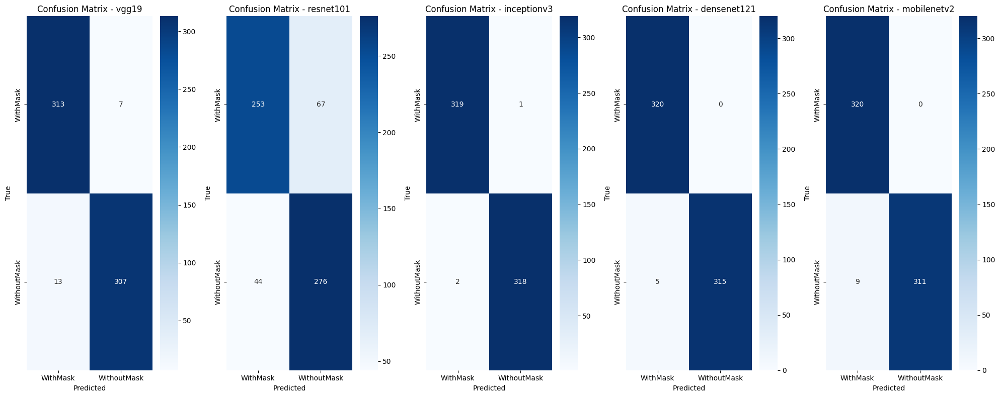

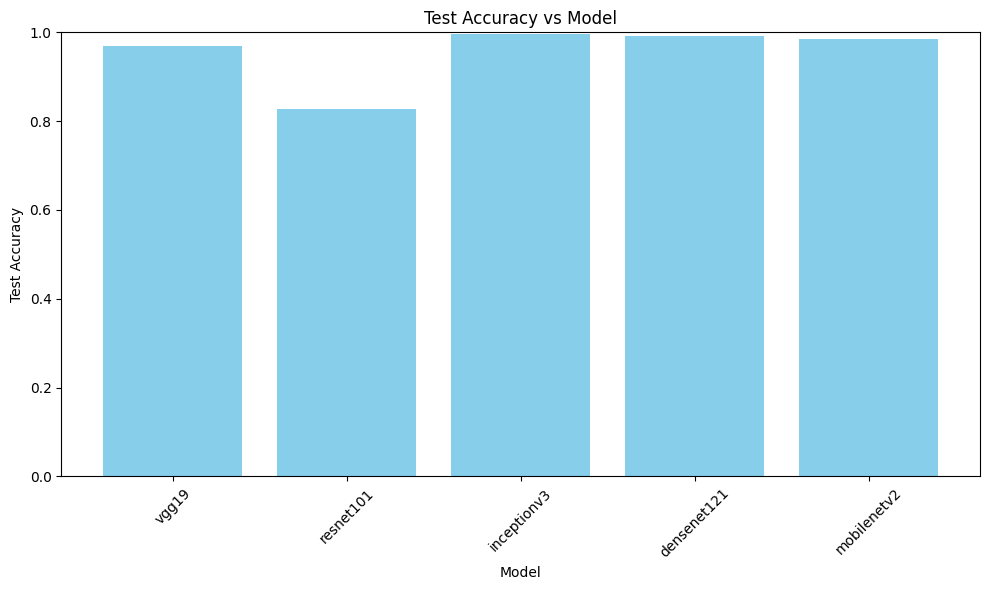

In [45]:

plt.figure(figsize=(20, 8))
for i, (model_name, (cm, class_names)) in enumerate(confusion_matrices.items(), start=1):
    plt.subplot(1, len(MODELS), i)
    sns.heatmap(cm, annot=True, fmt='d', xticklabels=class_names, yticklabels=class_names, cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f'Confusion Matrix - {model_name}')
plt.tight_layout()
plt.savefig('confusion_matrices.png')
plt.show()


plt.figure(figsize=(10, 6))
plt.bar(test_accuracies.keys(), test_accuracies.values(), color='skyblue')
plt.xlabel('Model')
plt.ylabel('Test Accuracy')
plt.title('Test Accuracy vs Model')
plt.xticks(rotation=45)
plt.ylim(0, 1) 
plt.tight_layout()
plt.savefig('test_accuracies.png')
plt.show()

Found 640 images belonging to 2 classes.


C:\Users\mmac259\AppData\Roaming\Python\Python310\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


20/20 ━━━━━━━━━━━━━━━━━━━━ 24s 1s/step


20/20 ━━━━━━━━━━━━━━━━━━━━ 18s 726ms/step


20/20 ━━━━━━━━━━━━━━━━━━━━ 9s 355ms/step


20/20 ━━━━━━━━━━━━━━━━━━━━ 13s 472ms/step


20/20 ━━━━━━━━━━━━━━━━━━━━ 5s 193ms/step


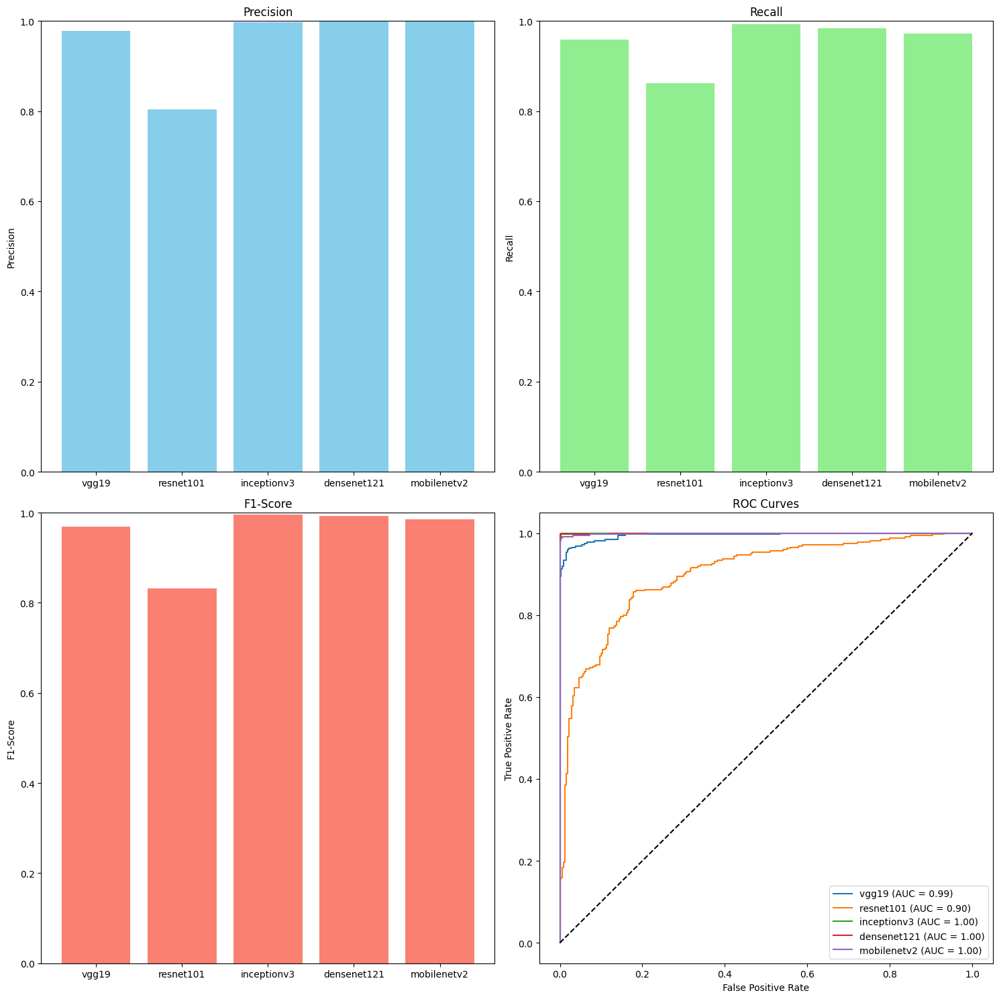

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import load_model
from sklearn.metrics import classification_report, roc_curve, auc

IMG_HEIGHT = 128
IMG_WIDTH = 128
BATCH_SIZE = 32
MODEL_NAMES = ['vgg19_model.h5', 'resnet101_model.h5', 'inceptionv3_model.h5', 'densenet121_model.h5', 'mobilenetv2_model.h5']

datagen = ImageDataGenerator(rescale=1./255)

test_generator = datagen.flow_from_directory(
    'Test',
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='binary',
    shuffle=False
)

performance_metrics = {}

for model_name in MODEL_NAMES:
    model = load_model(model_name)
    
    y_true = test_generator.classes
    y_pred_probs = model.predict(test_generator)
    y_pred = (y_pred_probs > 0.5).astype(int)

    report = classification_report(y_true, y_pred, output_dict=True)
    precision = report['1']['precision']
    recall = report['1']['recall']
    f1_score = report['1']['f1-score']

    fpr, tpr, _ = roc_curve(y_true, y_pred_probs)
    roc_auc = auc(fpr, tpr)

    model_key = model_name.split('_')[0]  
    performance_metrics[model_key] = {
        'precision': precision,
        'recall': recall,
        'f1_score': f1_score,
        'roc_auc': roc_auc,
        'fpr': fpr,
        'tpr': tpr,
    }

fig, axs = plt.subplots(2, 2, figsize=(15, 15))

# Precision
axs[0, 0].bar(performance_metrics.keys(), [metrics['precision'] for metrics in performance_metrics.values()], color='skyblue')
axs[0, 0].set_title('Precision')
axs[0, 0].set_ylabel('Precision')
axs[0, 0].set_ylim(0, 1)

# Recall
axs[0, 1].bar(performance_metrics.keys(), [metrics['recall'] for metrics in performance_metrics.values()], color='lightgreen')
axs[0, 1].set_title('Recall')
axs[0, 1].set_ylabel('Recall')
axs[0, 1].set_ylim(0, 1)

# F1-Score
axs[1, 0].bar(performance_metrics.keys(), [metrics['f1_score'] for metrics in performance_metrics.values()], color='salmon')
axs[1, 0].set_title('F1-Score')
axs[1, 0].set_ylabel('F1-Score')
axs[1, 0].set_ylim(0, 1)

# ROC Curves
for model_name, metrics in performance_metrics.items():
    axs[1, 1].plot(metrics['fpr'], metrics['tpr'], label=f'{model_name} (AUC = {metrics["roc_auc"]:.2f})')
axs[1, 1].plot([0, 1], [0, 1], 'k--')
axs[1, 1].set_title('ROC Curves')
axs[1, 1].set_xlabel('False Positive Rate')
axs[1, 1].set_ylabel('True Positive Rate')
axs[1, 1].legend(loc='lower right')

plt.tight_layout()
plt.savefig('performance_metrics.png')
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
Model: inceptionv3_model.h5, Image: NewTest\178.png, Prediction: [[4.866569e-09]], Label: With Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
Model: inceptionv3_model.h5, Image: NewTest\187.png, Prediction: [[1.5346592e-08]], Label: With Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
Model: inceptionv3_model.h5, Image: NewTest\190.png, Prediction: [[1.4227006e-10]], Label: With Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
Model: inceptionv3_model.h5, Image: NewTest\219.png, Prediction: [[2.7643983e-11]], Label: With Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
Model: inceptionv3_model.h5, Image: NewTest\231.png, Prediction: [[4.5847122e-05]], Label: With Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
Model: inceptionv3_model.h5, Image: NewTest\283.png, Prediction: [[1.]], Label: Without Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
Model: inceptionv3_model.h5, Image: NewTest\350.png, Prediction: [[1.7430943e-12]], Label: With Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


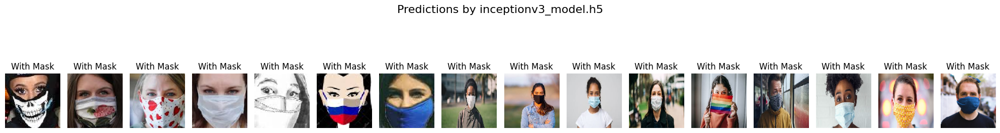

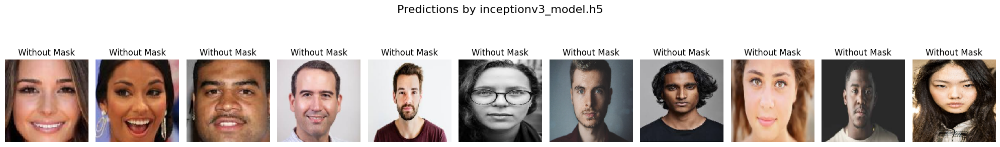

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
Model: densenet121_model.h5, Image: NewTest\178.png, Prediction: [[4.049454e-12]], Label: With Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
Model: densenet121_model.h5, Image: NewTest\187.png, Prediction: [[1.6674944e-15]], Label: With Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
Model: densenet121_model.h5, Image: NewTest\190.png, Prediction: [[5.676101e-09]], Label: With Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
Model: densenet121_model.h5, Image: NewTest\219.png, Prediction: [[1.3603387e-11]], Label: With Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
Model: densenet121_model.h5, Image: NewTest\231.png, Prediction: [[6.5472124e-12]], Label: With Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
Model: densenet121_model.h5, Image: NewTest\283.png, Prediction: [[0.9999995]], Label: Without Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
Model: densenet121_model.h5, Image: NewTest\350.png, Prediction: [[1.3997115e-14]], Label: With Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms

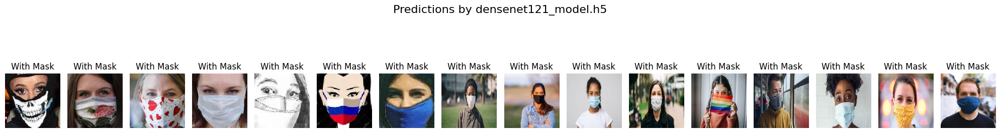

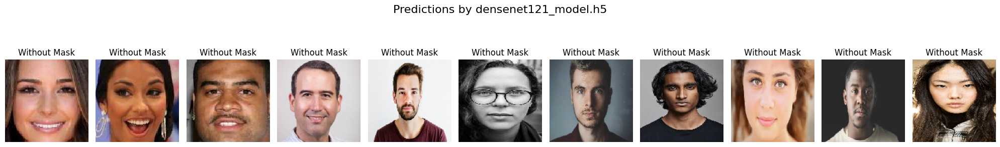

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step
Model: vgg19_model.h5, Image: NewTest\178.png, Prediction: [[0.7063502]], Label: Without Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
Model: vgg19_model.h5, Image: NewTest\187.png, Prediction: [[0.00455936]], Label: With Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
Model: vgg19_model.h5, Image: NewTest\190.png, Prediction: [[0.00591513]], Label: With Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
Model: vgg19_model.h5, Image: NewTest\219.png, Prediction: [[0.00491378]], Label: With Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
Model: vgg19_model.h5, Image: NewTest\231.png, Prediction: [[0.00137972]], Label: With Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
Model: vgg19_model.h5, Image: NewTest\283.png, Prediction: [[0.9998327]], Label: Without Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
Model: vgg19_model.h5, Image: NewTest\350.png, Prediction: [[0.00395094]], Label: With Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
Model: vgg19_model.h5, Image: NewTest\35

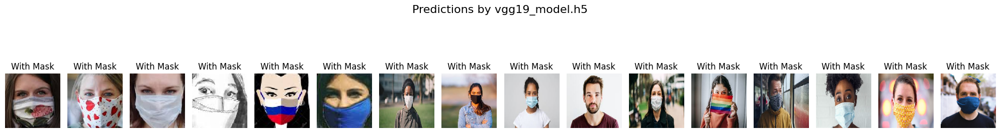

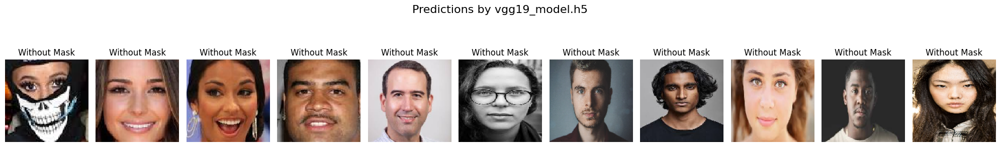

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Model: mobilenetv2_model.h5, Image: NewTest\178.png, Prediction: [[3.8931325e-09]], Label: With Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
Model: mobilenetv2_model.h5, Image: NewTest\187.png, Prediction: [[1.9640814e-10]], Label: With Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
Model: mobilenetv2_model.h5, Image: NewTest\190.png, Prediction: [[1.1401611e-09]], Label: With Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
Model: mobilenetv2_model.h5, Image: NewTest\219.png, Prediction: [[2.033661e-06]], Label: With Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
Model: mobilenetv2_model.h5, Image: NewTest\231.png, Prediction: [[1.3559447e-08]], Label: With Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
Model: mobilenetv2_model.h5, Image: NewTest\283.png, Prediction: [[0.9999933]], Label: Without Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
Model: mobilenetv2_model.h5, Image: NewTest\350.png, Prediction: [[8.678426e-09]], Label: With Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms

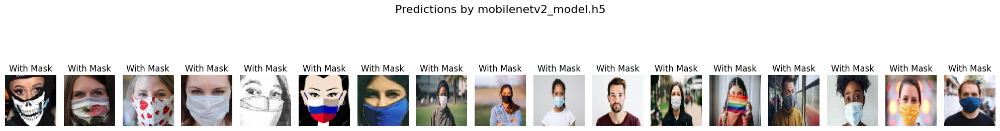

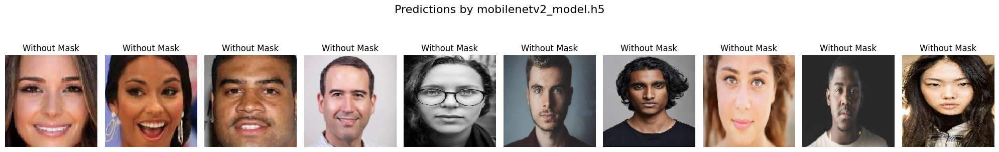

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
Model: resnet101_model.h5, Image: NewTest\178.png, Prediction: [[0.00427103]], Label: With Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
Model: resnet101_model.h5, Image: NewTest\187.png, Prediction: [[0.07194897]], Label: With Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
Model: resnet101_model.h5, Image: NewTest\190.png, Prediction: [[0.04231601]], Label: With Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
Model: resnet101_model.h5, Image: NewTest\219.png, Prediction: [[0.09886786]], Label: With Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
Model: resnet101_model.h5, Image: NewTest\231.png, Prediction: [[0.0526559]], Label: With Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
Model: resnet101_model.h5, Image: NewTest\283.png, Prediction: [[0.9242979]], Label: Without Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
Model: resnet101_model.h5, Image: NewTest\350.png, Prediction: [[0.00505993]], Label: With Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
Model: resnet101_model

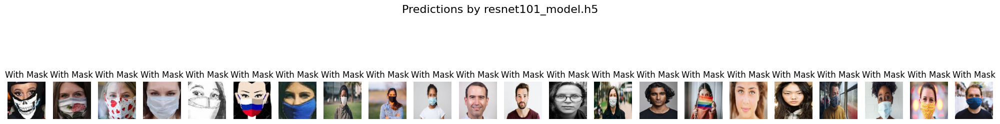

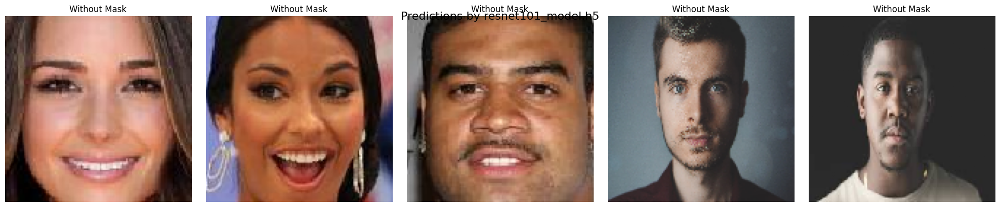

In [3]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model

IMG_HEIGHT = 128
IMG_WIDTH = 128
images_folder = 'NewTest'
models_folder = './' 

def load_and_preprocess_image(image_path):
    img = load_img(image_path, target_size=(IMG_HEIGHT, IMG_WIDTH))
    img_array = img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = img_array / 255.0  
    return img_array

def plot_images(images_arr, labels, model_name):
    fig, axes = plt.subplots(1, len(images_arr), figsize=(20, 4))
    axes = axes.flatten()
    for img, ax, label in zip(images_arr, axes, labels):
        ax.imshow(img)
        ax.axis('off')
        ax.set_title(label)
    plt.tight_layout()
    plt.suptitle(f'Predictions by {model_name}', size=16)
    plt.show()


model_names = [ 'inceptionv3_model.h5', 'densenet121_model.h5', 'vgg19_model.h5','mobilenetv2_model.h5', 'resnet101_model.h5']

image_paths = [os.path.join(images_folder, img_name) for img_name in os.listdir(images_folder)]


for model_name in model_names:

    model_path = os.path.join(models_folder, model_name)
    model = load_model(model_path)
    
    with_mask_images = []
    without_mask_images = []

    for image_path in image_paths:
        try:
            img_array = load_and_preprocess_image(image_path)
            prediction = model.predict(img_array)
            label = 'Without Mask' if prediction > 0.5 else 'With Mask'
            print(f"Model: {model_name}, Image: {image_path}, Prediction: {prediction}, Label: {label}")
            if label == 'Without Mask':
                without_mask_images.append(img_array[0])
            else:
                with_mask_images.append(img_array[0])
        except Exception as e:
            print(f"Error loading image {image_path}: {e}")

    if with_mask_images:
        plot_images(with_mask_images, ['With Mask'] * len(with_mask_images), model_name)

    if without_mask_images:
        plot_images(without_mask_images, ['Without Mask'] * len(without_mask_images), model_name)


#### Ex 7.1: Using Active learning and verifying its effect on models performance.

##### Defining the methods and loading data

In [40]:
import tensorflow as tf
import numpy as np
import os
import shutil
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import load_model

img_height = 128
img_width = 128
batch_size = 32
epochs = 10
samples_to_label = 100

data_gen = ImageDataGenerator(rescale=1./255)

train_data = data_gen.flow_from_directory(
    'Train',
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary'
)

val_data = data_gen.flow_from_directory(
    'Validation',
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary'
)

test_data = data_gen.flow_from_directory(
    'Test',
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary',
    shuffle=False
)

unlabeled_data = data_gen.flow_from_directory(
    'Unlabeled',
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode=None,
    shuffle=True
)

def active_learning_iteration(model_name, model):
    model_path = os.path.join('./', model_name)
    model = load_model(model_path)

    predictions = model.predict(unlabeled_data, verbose=1)
    uncertainties = np.abs(predictions - 0.5).flatten()

    uncertain_indices = np.argsort(uncertainties)[:samples_to_label]
    uncertain_files = np.array(unlabeled_data.filenames)[uncertain_indices]

    filenames = [os.path.basename(f) for f in uncertain_files]
    print(filenames)
    
    return model, filenames

def move_images_to_file(files_to_move):
    unlabeled_dir = 'Unlabeled\\Unlabeled'
    train_dir = 'Train'
    mask_dir = os.path.join(train_dir, 'withMask')
    no_mask_dir = os.path.join(train_dir, 'withoutMask')

    os.makedirs(mask_dir, exist_ok=True)
    os.makedirs(no_mask_dir, exist_ok=True)

    for filename in files_to_move:
        file_path = os.path.join(unlabeled_dir, filename)
        
        if os.path.isfile(file_path):
            if filename.startswith('Augmented'):
                shutil.move(file_path, os.path.join(mask_dir, filename))
            elif filename[0].isdigit():
                shutil.move(file_path, os.path.join(no_mask_dir, filename))
        else:
            print(f"File not found: {file_path}")

    print("Files have been moved to the respective directories.")

def retrain_model(model_name, model):
    model_path = os.path.join('./', model_name)
    model = load_model(model_path)

    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    train_data = data_gen.flow_from_directory(
        'Train',
        target_size=(img_height, img_width),
        batch_size=batch_size,
        class_mode='binary'
    )

    history = model.fit(train_data, validation_data=val_data, epochs=5)
    return model


Found 3099 images belonging to 2 classes.
Found 640 images belonging to 2 classes.
Found 640 images belonging to 2 classes.
Found 100 images belonging to 1 classes.


##### Iteration 1

In [36]:
model = None

model, files = active_learning_iteration('resnet101_model.h5', model)
print()
print()
move_images_to_file(files)
print()
print()

model = train_model('resnet101_model.h5', model)

model_name = 'resnet101_model_iteration_1.h5'
model_path = os.path.join('./', model_name)
model.save(model_path)
print(f'Model saved as {model_path}')

history_data = history.history
history_file = f'{model_name}_history.json'
with open(history_file, 'w') as f:
    json.dump(history_data, f)
print(f'Training history saved as {history_file}')


Active Learning Iteration with model: resnet101_model.h5


C:\Users\mmac259\AppData\Roaming\Python\Python310\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 14s 1s/step 
['Augmented_188_1011922.png', '2281.png', '2342.png', 'Augmented_195_9835905.png', 'Augmented_190_2672112.png', 'Augmented_142_9403771.png', 'Augmented_200_9667529.png', 'Augmented_127_99.png', '2116.png', 'Augmented_155_8677387.png', '2397.png', 'Augmented_188_1033850.png', '2503.png', '2148.png', 'Augmented_122_9885756.png', 'Augmented_129_7974032.png', 'Augmented_164_234928.png', 'Augmented_123_1480540.png', 'Augmented_203_3327352.png', '2305.png', '2310.png', 'Augmented_130_934402.png', 'Augmented_153_6511400.png', 'Augmented_167_7768054.png', '2322.png', '2358.png', 'Augmented_166_3048399.png', '2390.png', '2339.png', '2147.png', '2303.png', '2506.png', '2367.png', '2487.png', 'Augmented_122_7836976.png', 'Augmented_201_1670634.png', '2362.png', 'Augmented_841_4526145.png', '2492.png', '2369.png', '2505.png', 'Augmented_154_4469620.png', '2302.png', '2110.png', '2323.png', '2298.png', 'Augmented_121_9997608.png', 'Augmented_157_9032932.png',

Found 2999 images belonging to 2 classes.
Epoch 1/5
94/94 ━━━━━━━━━━━━━━━━━━━━ 102s 926ms/step - accuracy: 0.8252 - loss: 0.3881 - val_accuracy: 0.8188 - val_loss: 0.4066
Epoch 2/5
94/94 ━━━━━━━━━━━━━━━━━━━━ 87s 884ms/step - accuracy: 0.8390 - loss: 0.3639 - val_accuracy: 0.7469 - val_loss: 0.5099
Epoch 3/5
94/94 ━━━━━━━━━━━━━━━━━━━━ 86s 886ms/step - accuracy: 0.8531 - loss: 0.3623 - val_accuracy: 0.8203 - val_loss: 0.3988
Epoch 4/5
94/94 ━━━━━━━━━━━━━━━━━━━━ 85s 868ms/step - accuracy: 0.8637 - loss: 0.3237 - val_accuracy: 0.8375 - val_loss: 0.3677
Epoch 5/5
94/94 ━━━━━━━━━━━━━━━━━━━━ 86s 879ms/step - accuracy: 0.8730 - loss: 0.3086 - val_accuracy: 0.7797 - val_loss: 0.5303


Model saved as ./resnet101_model_iteration_1.h5
Training history saved as resnet101_model_iteration_1.h5_history.json


##### Iteration 2

In [39]:
model,f=active_learning_iteration('resnet101_model_iteration_1.h5',model)

print()
print()
move_images_to_file(f)
print()
print()

model=train_model('resnet101_model_iteration_1.h5',model)
model_name = 'resnet101_model_iteration_2.h5'
model_path = os.path.join(models_folder, model_name)
model.save(model_path)
print(f'Model saved as {model_path}')

history_dict = history.history
history_filename = f'{model_name}_history.json'
with open(history_filename, 'w') as f:
    json.dump(history_dict, f)
print(f'Training history saved as {history_filename}')

Active Learning Iteration with model: resnet101_model_iteration_1.h5


C:\Users\mmac259\AppData\Roaming\Python\Python310\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


7/7 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step 
['2174.png', '2294.png', '2525.png', 'Augmented_126_3213986.png', '2366.png', 'Augmented_132_16501.png', '2283.png', '2461.png', '2499.png', '2313.png', 'Augmented_124_438107.png', 'Augmented_161_612594.png', '2306.png', 'Augmented_160_760182.png', '2460.png', '2156.png', '2479.png', 'Augmented_202_319856.png', '2472.png', '2348.png', 'Augmented_124_9505309.png', 'Augmented_155_2219348.png', '2341.png', 'Augmented_142_9098843.png', '2354.png', '2074.png', 'Augmented_126_6286178.png', '2516.png', '2387.png', 'Augmented_131_8577086.png', '2518.png', '2400.png', 'Augmented_202_9754097.png', 'Augmented_152_9503415.png', '2512.png', '2295.png', '2381.png', '2337.png', '2336.png', '2517.png', '2361.png', '2316.png', 'Augmented_125_9536470.png', 'Augmented_122_2030302.png', 'Augmented_160_9074928.png', 'Augmented_127_4223591.png', 'Augmented_130_4523111.png', 'Augmented_168_636700.png', 'Augmented_125_9871364.png', 'Augmented_196_5628361.png', 'Augmented_

Found 3099 images belonging to 2 classes.
Epoch 1/5
97/97 ━━━━━━━━━━━━━━━━━━━━ 103s 918ms/step - accuracy: 0.8477 - loss: 0.3539 - val_accuracy: 0.8297 - val_loss: 0.3704
Epoch 2/5
97/97 ━━━━━━━━━━━━━━━━━━━━ 88s 882ms/step - accuracy: 0.8761 - loss: 0.3014 - val_accuracy: 0.8250 - val_loss: 0.3707
Epoch 3/5
97/97 ━━━━━━━━━━━━━━━━━━━━ 88s 885ms/step - accuracy: 0.8763 - loss: 0.3116 - val_accuracy: 0.8422 - val_loss: 0.3527
Epoch 4/5
97/97 ━━━━━━━━━━━━━━━━━━━━ 87s 869ms/step - accuracy: 0.8633 - loss: 0.3248 - val_accuracy: 0.8406 - val_loss: 0.3437
Epoch 5/5
97/97 ━━━━━━━━━━━━━━━━━━━━ 87s 873ms/step - accuracy: 0.8716 - loss: 0.3193 - val_accuracy: 0.8406 - val_loss: 0.3456


Model saved as ./resnet101_model_iteration_2.h5
Training history saved as resnet101_model_iteration_2.h5_history.json


##### Iteration 

In [41]:
model,f=active_learning_iteration('resnet101_model_iteration_2.h5',model)

print()
print()
move_images_to_file(f)
print()
print()

model=train_model('resnet101_model_iteration_2.h5',model)

model_name = 'resnet101_model_iteration_3.h5'
model_path = os.path.join(models_folder, model_name)
model.save(model_path)
print(f'Model saved as {model_path}')

history_dict = history.history
history_filename = f'{model_name}_history.json'
with open(history_filename, 'w') as f:
    json.dump(history_dict, f)
print(f'Training history saved as {history_filename}')

Active Learning Iteration with model: resnet101_model_iteration_2.h5


4/4 ━━━━━━━━━━━━━━━━━━━━ 9s 2s/step  
['Augmented_157_3571532.png', '2307.png', '2519.png', 'Augmented_189_8372816.png', '2351.png', 'Augmented_165_8927752.png', '2152.png', 'Augmented_135_8205428.png', '2343.png', '2344.png', '2320.png', 'Augmented_122_32642.png', 'Augmented_130_8130609.png', 'Augmented_123_234492.png', 'Augmented_193_2525306.png', 'Augmented_124_677991.png', 'Augmented_190_4756924.png', 'Augmented_200_4695730.png', 'Augmented_162_2201276.png', 'Augmented_131_9731382.png', '2104.png', '2113.png', 'Augmented_127_9987249.png', 'Augmented_126_9710655.png', '2526.png', '2288.png', '2360.png', '2373.png', '2338.png', '2329.png', 'Augmented_155_932360.png', 'Augmented_191_1202396.png', 'Augmented_163_2756592.png', '2300.png', 'Augmented_156_2961688.png', '2370.png', 'Augmented_166_680824.png', '2384.png', 'Augmented_203_418066.png', '2363.png', 'Augmented_168_5501285.png', '2356.png', 'Augmented_197_5682271.png', 'Augmented_145_7840110.png', 'Augmented_161_199132.png', '215

Found 3199 images belonging to 2 classes.
Epoch 1/5
100/100 ━━━━━━━━━━━━━━━━━━━━ 102s 883ms/step - accuracy: 0.8730 - loss: 0.3025 - val_accuracy: 0.8453 - val_loss: 0.3366
Epoch 2/5
100/100 ━━━━━━━━━━━━━━━━━━━━ 88s 845ms/step - accuracy: 0.8794 - loss: 0.2836 - val_accuracy: 0.8281 - val_loss: 0.3571
Epoch 3/5
100/100 ━━━━━━━━━━━━━━━━━━━━ 89s 853ms/step - accuracy: 0.8842 - loss: 0.2679 - val_accuracy: 0.8188 - val_loss: 0.3616
Epoch 4/5
100/100 ━━━━━━━━━━━━━━━━━━━━ 90s 868ms/step - accuracy: 0.8650 - loss: 0.3134 - val_accuracy: 0.8109 - val_loss: 0.4318
Epoch 5/5
100/100 ━━━━━━━━━━━━━━━━━━━━ 116s 1s/step - accuracy: 0.8732 - loss: 0.2922 - val_accuracy: 0.8250 - val_loss: 0.3866


Model saved as ./resnet101_model_iteration_3.h5
Training history saved as resnet101_model_iteration_3.h5_history.json


In [42]:
test_loss, test_acc = model.evaluate(test_gen, verbose=2)
print(f'Final Model - Loss: {test_loss}, Accuracy: {test_acc:.4f}')

results = {
    'test_loss': test_loss,
    'test_accuracy': test_acc
}
results_filename = f'{model_name}_final_results.json'
with open(results_filename, 'w') as f:
    json.dump(results, f)
print(f'Test results saved as {results_filename}')

20/20 - 17s - 848ms/step - accuracy: 0.8234 - loss: 0.4129
Final Model - Loss: 0.4128965437412262, Accuracy: 0.8234
Test results saved as resnet101_model_iteration_3.h5_final_results.json


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
Image: NewTest\178.png, Prediction: [[0.0108748]], Label: With Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
Image: NewTest\187.png, Prediction: [[0.08122314]], Label: With Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
Image: NewTest\190.png, Prediction: [[0.08247141]], Label: With Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
Image: NewTest\219.png, Prediction: [[0.14663976]], Label: With Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
Image: NewTest\231.png, Prediction: [[0.07945562]], Label: With Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
Image: NewTest\283.png, Prediction: [[0.9885069]], Label: Without Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
Image: NewTest\350.png, Prediction: [[0.00109553]], Label: With Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
Image: NewTest\351.png, Prediction: [[0.4990173]], Label: With Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
Image: NewTest\69.png, Prediction: [[0.952248]], Label: Without Mask
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step

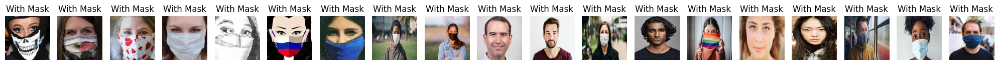

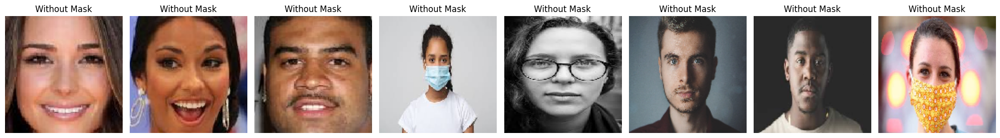

In [45]:
import os
from tensorflow.keras.preprocessing.image import load_img, img_to_array

images_folder = 'NewTest'
IMG_HEIGHT = 128
IMG_WIDTH = 128
def load_and_preprocess_image(image_path):
    img = load_img(image_path, target_size=(128, 128))
    img_array = img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = img_array / 255.0  
    return img_array

image_paths = [os.path.join(images_folder, img_name) for img_name in os.listdir(images_folder)]
with_mask_images = []
without_mask_images = []

for image_path in image_paths:
    try:
        img_array = load_and_preprocess_image(image_path)
        prediction = model.predict(img_array)
        label = 'Without Mask' if prediction > 0.5 else 'With Mask'
        print(f"Image: {image_path}, Prediction: {prediction}, Label: {label}")
        if label == 'Without Mask':
            without_mask_images.append(img_array[0])
        else:
            with_mask_images.append(img_array[0])
    except Exception as e:
        print(f"Error loading image {image_path}: {e}")

def plot_images(images_arr, labels):
    fig, axes = plt.subplots(1, len(images_arr), figsize=(20, 20))
    axes = axes.flatten()
    for img, ax, label in zip(images_arr, axes, labels):
        ax.imshow(img)
        ax.axis('off')
        ax.set_title(label)
    plt.tight_layout()
    plt.show()

if with_mask_images:
    plot_images(with_mask_images, ['With Mask'] * len(with_mask_images))

if without_mask_images:
    plot_images(without_mask_images, ['Without Mask'] * len(without_mask_images))
